## Model Evaluation

In [126]:
import pandas as pd
import numpy as np
import optuna
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, f1_score, recall_score, auc, average_precision_score
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
import joblib
import sys
from pathlib import Path
import shap

PARENT_DIRECTORY_1 = Path.cwd().parent.parent.parent
sys.path.append(f"{str(PARENT_DIRECTORY_1)}")

from Training_Model.utils.algorithm import initial_models
from Training_Model.utils.optuna_tunning import OptunaTunning
from Training_Model.utils.metrics import curves_roc_pr, calibration_curve, ks_table, bad_rate_decil, bad_rate_acumulado, lift_acumulado, lift_bandas, tabla_deciles_completa, top_decile_capture, tabla_deciles_completa_saldos, seleccion_deciles_agrupamiento, tanteo_deciles, gestion_portafolio



ImportError: cannot import name 'top_decile_capture' from 'Training_Model.utils.metrics' (/Users/davidrodriguez/Desarrollos/portafolio/handsbook-ds/Training_Model/utils/metrics.py)

In [2]:
df_train = pd.read_csv('../data/raw/cs-training.csv', index_col=0)
df_test = pd.read_csv('../data/raw/cs-test.csv', index_col=0)

TARGET = 'SeriousDlqin2yrs'
FEATS_NUMERICAS = [c for c in df_train.columns.tolist() if c != TARGET]

In [3]:
params_catboost = joblib.load('../artifacts/training_model/params_catboost.pkl')
params_lgbm = joblib.load('../artifacts/training_model/params_lgbm.pkl')

In [4]:
preprocessing_linear = joblib.load('../artifacts/feature_engineering/preprocessing.pkl')

In [5]:
pipeline_htunning_catboost = joblib.load('../pipeline_htunning_catboost.pkl')
pipeline_htunning_lgbm = joblib.load('../pipeline_htunning_lgbm.pkl')

In [6]:
predict_catboost_test = pipeline_htunning_catboost.predict_proba(X= df_test[FEATS_NUMERICAS])[:,1]
predict_lgbm_test = pipeline_htunning_lgbm.predict_proba(X= df_test[FEATS_NUMERICAS])[:,1]

In [7]:
df_predict_test_catboost = pd.DataFrame(predict_catboost_test, index= df_test.index).reset_index(drop= False)
df_predict_test_catboost.columns = ['Id', 'Probability']
df_predict_test_catboost.to_csv('submission_catboost.csv', index= False)

df_predict_test_lgbm = pd.DataFrame(predict_lgbm_test, index= df_test.index).reset_index(drop= False)
df_predict_test_lgbm.columns = ['Id', 'Probability']
df_predict_test_lgbm.to_csv('submission_lgbm.csv', index= False)

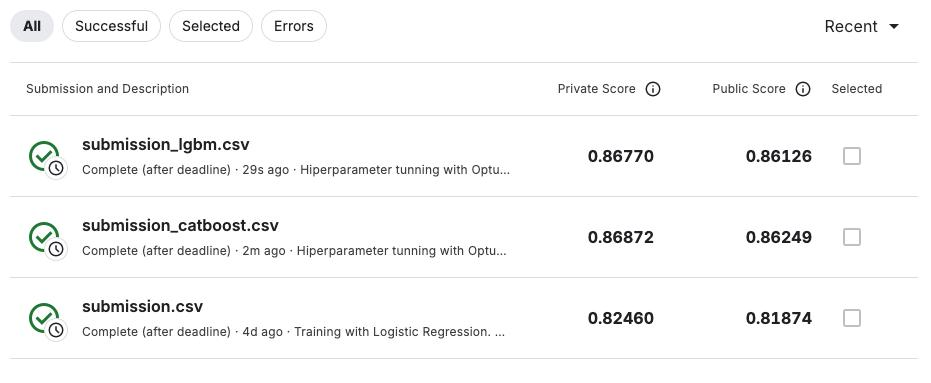

In [8]:
## Resultados de comparar los resultados con el dataset de test
from IPython.display import Image, display
display(Image(filename= '../data/interim/results_model.jpeg'))

## Milla Extra: Considerar Validation como Test
- Al ser un concurso de Kaggle no entregan el default rate real del dataset de test por lo que no se puede medir la calibración ni visualizar la curva ROC-AUC o SHAP.
- Por ello dividiremos el dataset de train en train y validation.
- Se usará el preprocessing realizado en el notebook de feature engineering pero se hará nuevamente la optimización de hiperparametros con CatBoost y LightGBM

In [7]:
X_train, X_val, y_train, y_val = train_test_split(df_train[FEATS_NUMERICAS], df_train[TARGET], stratify= df_train[TARGET], random_state= 42, test_size= 0.3)
print(X_train.shape)
print(X_val.shape)
print(f'X_train target mean: {round(y_train.mean(), 3)}')
print(f'X_val target mean: {round(y_val.mean(), 3)}')

(105000, 10)
(45000, 10)
X_train target mean: 0.067
X_val target mean: 0.067


In [8]:
df_val = pd.concat([X_val, y_val], axis= 1)
df_val

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,SeriousDlqin2yrs
31295,0.000000,50,0,0.087478,9830.0,6,1,0,1,0.0,1
96644,0.005770,52,0,0.063603,10486.0,16,0,1,0,0.0,0
144650,0.807706,64,0,0.555962,4100.0,8,0,2,0,1.0,0
96912,0.001076,53,0,0.269278,2450.0,8,0,0,0,0.0,0
120438,0.022680,58,0,0.369809,17600.0,17,0,2,0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...
113351,1.000000,46,1,14.000000,NaN,0,2,0,2,0.0,1
126614,0.065615,48,1,1292.000000,NaN,7,0,2,0,NaN,0
137308,1.000000,51,0,0.059608,7800.0,3,1,0,0,2.0,0
87701,0.020657,67,0,43.000000,NaN,7,0,0,0,0.0,0


In [9]:
df_val.to_csv('df_val.csv')

In [15]:
weight_class_train = float((y_train == 0).sum() / (y_train == 1).sum())
weight_class_train


13.961527500712453

In [16]:
params = {
    'LGBMClassifier': {
        'n_estimators' : {
            'type': 'int',
            'min': 50,
            'max': 400
        },
        'learning_rate': {
            'type': 'float',
            'min': 0.01,
            'max': 0.5,
            'log': True
        },
        'num_leaves': {
            'type': 'int',
            'min': 15,
            'max': 40
        },
        'min_child_samples': {
            'type': 'int',
            'min': 20,
            'max': 40
        },
        'min_child_samples': {
            'type': 'int',
            'min': 20,
            'max': 50
        },
        'min_child_weight': {
            'type': 'float',
            'min': 0.1,
            'max': 10.0,
            'log': True
        },
        'min_split_gain': {
            'type': 'int',
            'min': 0,
            'max': 3
        },
        'reg_alpha': {
            'type': 'float',
            'min': 0.1,
            'max': 10.0,
            'log': True
        },
        'reg_lambda': {
            'type': 'float',
            'min': 0.1,
            'max': 10.0
        },
        'scale_pos_weight': {
            'type': 'fixed',
            'value': weight_class_train
        }

    },
    'CatBoostClassifier': {
        'iterations': {
            'type': 'int',
            'min': 800,
            'max': 1500
        },
        'depth': {
            'type': 'int',
            'min': 4,
            'max': 10
        },
        'learning_rate': {
            'type': 'float',
            'min': 0.01,
            'max': 0.5,
            'log': True
        },
        'min_data_in_leaf': {
            'type': 'int',
            'min': 20,
            'max': 40
        },
        'l2_leaf_reg': {
            'type': 'float',
            'min': 2.5,
            'max': 10.0,
            'log': True
        },
        'random_strength': {
            'type': 'float',
            'min': 0.1,
            'max': 10.0,
            'log': True
        },
        'bagging_temperature': {
            'type': 'float',
            'min': 0.0,
            'max': 5.0
        },
        'scale_pos_weight': {
            'type': 'fixed',
            'value': weight_class_train
        },
        'leaf_estimation_method': {
            'type': 'fixed',
            'value': 'Newton'
        },
        'loss_function': {
            'type': 'fixed',
            'value': 'Logloss'
        }

    }
}

In [17]:
optuna_tunning_2 = OptunaTunning(
    nombre_proyecto= 'Give-me-credit-v2',
    n_trials= 50,
    random_state= 42,
    activate_preprocessor_trees= False,
    algoritmos= [CatBoostClassifier, LGBMClassifier],
    preprocessor_linear= preprocessing_linear,
    X= X_train,
    y= y_train,
    params= params
)
best_params = optuna_tunning_2.optimize()

[I 2026-08-16 20:22:58,164] A new study created in memory with name: no-name-da855930-1baa-49c0-a8b0-e71123f22a26


0:	learn: 0.6102085	total: 66.5ms	remaining: 1m 10s
1:	learn: 0.5576965	total: 77.4ms	remaining: 41s
2:	learn: 0.5222596	total: 87.8ms	remaining: 31s
3:	learn: 0.4992283	total: 97.1ms	remaining: 25.7s
4:	learn: 0.4842354	total: 106ms	remaining: 22.4s
5:	learn: 0.4738146	total: 115ms	remaining: 20.3s
6:	learn: 0.4668603	total: 124ms	remaining: 18.7s
7:	learn: 0.4591871	total: 134ms	remaining: 17.6s
8:	learn: 0.4537124	total: 143ms	remaining: 16.8s
9:	learn: 0.4480143	total: 153ms	remaining: 16.1s
10:	learn: 0.4447941	total: 163ms	remaining: 15.6s
11:	learn: 0.4405951	total: 172ms	remaining: 15.1s
12:	learn: 0.4377484	total: 182ms	remaining: 14.7s
13:	learn: 0.4349743	total: 192ms	remaining: 14.3s
14:	learn: 0.4330569	total: 200ms	remaining: 14s
15:	learn: 0.4306463	total: 210ms	remaining: 13.7s
16:	learn: 0.4290946	total: 219ms	remaining: 13.4s
17:	learn: 0.4274292	total: 228ms	remaining: 13.2s
18:	learn: 0.4258181	total: 236ms	remaining: 13s
19:	learn: 0.4229907	total: 246ms	remaining:

[I 2026-08-16 20:23:46,734] Trial 0 finished with value: 0.8061643342337341 and parameters: {'iterations': 1062, 'depth': 10, 'learning_rate': 0.17524101118128144, 'min_data_in_leaf': 32, 'l2_leaf_reg': 3.1036489296062775, 'random_strength': 0.20511104188433976, 'bagging_temperature': 0.2904180608409973}. Best is trial 0 with value: 0.8061643342337341.


1056:	learn: 0.0514489	total: 9.5s	remaining: 44.9ms
1057:	learn: 0.0513690	total: 9.51s	remaining: 35.9ms
1058:	learn: 0.0512607	total: 9.52s	remaining: 27ms
1059:	learn: 0.0512065	total: 9.52s	remaining: 18ms
1060:	learn: 0.0511410	total: 9.53s	remaining: 8.98ms
1061:	learn: 0.0509849	total: 9.54s	remaining: 0us
0:	learn: 0.6318874	total: 16.7ms	remaining: 23.5s
1:	learn: 0.5895147	total: 30.3ms	remaining: 21.3s
2:	learn: 0.5659147	total: 36.3ms	remaining: 17s
3:	learn: 0.5378753	total: 43.5ms	remaining: 15.2s
4:	learn: 0.5234670	total: 48.9ms	remaining: 13.7s
5:	learn: 0.5126309	total: 54.1ms	remaining: 12.6s
6:	learn: 0.5013690	total: 58.7ms	remaining: 11.7s
7:	learn: 0.4972526	total: 62.3ms	remaining: 10.9s
8:	learn: 0.4925090	total: 66.6ms	remaining: 10.3s
9:	learn: 0.4879185	total: 71.1ms	remaining: 9.93s
10:	learn: 0.4829440	total: 75.7ms	remaining: 9.6s
11:	learn: 0.4818503	total: 78.5ms	remaining: 9.13s
12:	learn: 0.4798917	total: 83.4ms	remaining: 8.95s
13:	learn: 0.4776582	

[I 2026-08-16 20:24:19,320] Trial 1 finished with value: 0.8245926344943453 and parameters: {'iterations': 1407, 'depth': 8, 'learning_rate': 0.15958573588141267, 'min_data_in_leaf': 20, 'l2_leaf_reg': 9.591442461979318, 'random_strength': 4.622589001020831, 'bagging_temperature': 1.0616955533913808}. Best is trial 1 with value: 0.8245926344943453.


1391:	learn: 0.1426590	total: 6.34s	remaining: 68.3ms
1392:	learn: 0.1425510	total: 6.35s	remaining: 63.8ms
1393:	learn: 0.1424009	total: 6.35s	remaining: 59.2ms
1394:	learn: 0.1423328	total: 6.36s	remaining: 54.7ms
1395:	learn: 0.1422492	total: 6.36s	remaining: 50.1ms
1396:	learn: 0.1421517	total: 6.37s	remaining: 45.6ms
1397:	learn: 0.1420586	total: 6.37s	remaining: 41ms
1398:	learn: 0.1419689	total: 6.37s	remaining: 36.5ms
1399:	learn: 0.1418486	total: 6.38s	remaining: 31.9ms
1400:	learn: 0.1417522	total: 6.38s	remaining: 27.3ms
1401:	learn: 0.1416452	total: 6.39s	remaining: 22.8ms
1402:	learn: 0.1415399	total: 6.39s	remaining: 18.2ms
1403:	learn: 0.1414451	total: 6.4s	remaining: 13.7ms
1404:	learn: 0.1413726	total: 6.4s	remaining: 9.11ms
1405:	learn: 0.1412566	total: 6.41s	remaining: 4.56ms
1406:	learn: 0.1411574	total: 6.41s	remaining: 0us
0:	learn: 0.6775356	total: 3.33ms	remaining: 3.08s
1:	learn: 0.6630329	total: 6.31ms	remaining: 2.92s
2:	learn: 0.6499426	total: 9.47ms	remaini

[I 2026-08-16 20:24:33,668] Trial 2 finished with value: 0.8635139998775958 and parameters: {'iterations': 927, 'depth': 5, 'learning_rate': 0.032877474139911184, 'min_data_in_leaf': 31, 'l2_leaf_reg': 4.549847316249378, 'random_strength': 0.38234752246751863, 'bagging_temperature': 3.0592644736118975}. Best is trial 2 with value: 0.8635139998775958.


911:	learn: 0.4187183	total: 2.77s	remaining: 45.5ms
912:	learn: 0.4187009	total: 2.77s	remaining: 42.5ms
913:	learn: 0.4186462	total: 2.77s	remaining: 39.4ms
914:	learn: 0.4185879	total: 2.77s	remaining: 36.4ms
915:	learn: 0.4185600	total: 2.78s	remaining: 33.4ms
916:	learn: 0.4185344	total: 2.78s	remaining: 30.3ms
917:	learn: 0.4184811	total: 2.79s	remaining: 27.3ms
918:	learn: 0.4184387	total: 2.79s	remaining: 24.3ms
919:	learn: 0.4184085	total: 2.79s	remaining: 21.2ms
920:	learn: 0.4183746	total: 2.79s	remaining: 18.2ms
921:	learn: 0.4183352	total: 2.8s	remaining: 15.2ms
922:	learn: 0.4183024	total: 2.8s	remaining: 12.1ms
923:	learn: 0.4182610	total: 2.8s	remaining: 9.1ms
924:	learn: 0.4182000	total: 2.81s	remaining: 6.07ms
925:	learn: 0.4181768	total: 2.81s	remaining: 3.04ms
926:	learn: 0.4181271	total: 2.81s	remaining: 0us
0:	learn: 0.6733409	total: 3.97ms	remaining: 3.55s
1:	learn: 0.6549377	total: 7.63ms	remaining: 3.41s
2:	learn: 0.6387858	total: 10.9ms	remaining: 3.26s
3:	lea

[I 2026-08-16 20:24:48,955] Trial 3 finished with value: 0.8613833497454945 and parameters: {'iterations': 897, 'depth': 6, 'learning_rate': 0.04192159350410976, 'min_data_in_leaf': 29, 'l2_leaf_reg': 7.424428704993703, 'random_strength': 0.2508115686045233, 'bagging_temperature': 2.571172192068058}. Best is trial 2 with value: 0.8635139998775958.


855:	learn: 0.3936908	total: 2.88s	remaining: 138ms
856:	learn: 0.3935957	total: 2.88s	remaining: 134ms
857:	learn: 0.3935294	total: 2.88s	remaining: 131ms
858:	learn: 0.3934577	total: 2.89s	remaining: 128ms
859:	learn: 0.3933908	total: 2.89s	remaining: 124ms
860:	learn: 0.3933022	total: 2.9s	remaining: 121ms
861:	learn: 0.3932202	total: 2.9s	remaining: 118ms
862:	learn: 0.3931751	total: 2.9s	remaining: 114ms
863:	learn: 0.3931008	total: 2.9s	remaining: 111ms
864:	learn: 0.3930736	total: 2.91s	remaining: 108ms
865:	learn: 0.3930414	total: 2.91s	remaining: 104ms
866:	learn: 0.3929771	total: 2.91s	remaining: 101ms
867:	learn: 0.3928826	total: 2.92s	remaining: 97.5ms
868:	learn: 0.3928501	total: 2.92s	remaining: 94.1ms
869:	learn: 0.3928003	total: 2.92s	remaining: 90.8ms
870:	learn: 0.3927155	total: 2.93s	remaining: 87.4ms
871:	learn: 0.3926421	total: 2.93s	remaining: 84ms
872:	learn: 0.3925941	total: 2.93s	remaining: 80.7ms
873:	learn: 0.3925487	total: 2.94s	remaining: 77.3ms
874:	learn:

[I 2026-08-16 20:25:05,957] Trial 4 finished with value: 0.8562112235911702 and parameters: {'iterations': 1215, 'depth': 4, 'learning_rate': 0.10769622478263129, 'min_data_in_leaf': 23, 'l2_leaf_reg': 2.7359299282470313, 'random_strength': 7.9026195497082306, 'bagging_temperature': 4.828160165372797}. Best is trial 2 with value: 0.8635139998775958.


1177:	learn: 0.3762619	total: 3.24s	remaining: 102ms
1178:	learn: 0.3762226	total: 3.25s	remaining: 99.1ms
1179:	learn: 0.3761783	total: 3.25s	remaining: 96.3ms
1180:	learn: 0.3761383	total: 3.25s	remaining: 93.6ms
1181:	learn: 0.3760965	total: 3.25s	remaining: 90.8ms
1182:	learn: 0.3760855	total: 3.26s	remaining: 88.1ms
1183:	learn: 0.3760308	total: 3.26s	remaining: 85.3ms
1184:	learn: 0.3759638	total: 3.26s	remaining: 82.6ms
1185:	learn: 0.3759053	total: 3.27s	remaining: 79.8ms
1186:	learn: 0.3758758	total: 3.27s	remaining: 77.1ms
1187:	learn: 0.3758393	total: 3.27s	remaining: 74.3ms
1188:	learn: 0.3757806	total: 3.27s	remaining: 71.6ms
1189:	learn: 0.3757496	total: 3.27s	remaining: 68.8ms
1190:	learn: 0.3757120	total: 3.28s	remaining: 66.1ms
1191:	learn: 0.3756544	total: 3.28s	remaining: 63.3ms
1192:	learn: 0.3756246	total: 3.28s	remaining: 60.6ms
1193:	learn: 0.3755780	total: 3.29s	remaining: 57.8ms
1194:	learn: 0.3755259	total: 3.29s	remaining: 55ms
1195:	learn: 0.3754824	total: 3

[I 2026-08-16 20:25:29,226] Trial 5 finished with value: 0.864068933242851 and parameters: {'iterations': 1366, 'depth': 6, 'learning_rate': 0.01465352103067214, 'min_data_in_leaf': 34, 'l2_leaf_reg': 4.6019109998605705, 'random_strength': 0.17541893487450796, 'bagging_temperature': 2.475884550556351}. Best is trial 5 with value: 0.864068933242851.


1356:	learn: 0.4166775	total: 4.58s	remaining: 30.4ms
1357:	learn: 0.4166576	total: 4.58s	remaining: 27ms
1358:	learn: 0.4166281	total: 4.59s	remaining: 23.6ms
1359:	learn: 0.4165715	total: 4.59s	remaining: 20.3ms
1360:	learn: 0.4165453	total: 4.59s	remaining: 16.9ms
1361:	learn: 0.4165089	total: 4.6s	remaining: 13.5ms
1362:	learn: 0.4164892	total: 4.6s	remaining: 10.1ms
1363:	learn: 0.4164711	total: 4.6s	remaining: 6.75ms
1364:	learn: 0.4164395	total: 4.61s	remaining: 3.38ms
1365:	learn: 0.4164104	total: 4.61s	remaining: 0us
0:	learn: 0.6799357	total: 9.47ms	remaining: 7.79s
1:	learn: 0.6672428	total: 18.6ms	remaining: 7.65s
2:	learn: 0.6555767	total: 27.4ms	remaining: 7.49s
3:	learn: 0.6448288	total: 35.3ms	remaining: 7.23s
4:	learn: 0.6343971	total: 44ms	remaining: 7.21s
5:	learn: 0.6239668	total: 52.8ms	remaining: 7.2s
6:	learn: 0.6151205	total: 57.5ms	remaining: 6.71s
7:	learn: 0.6068665	total: 65.3ms	remaining: 6.66s
8:	learn: 0.5989576	total: 74.6ms	remaining: 6.76s
9:	learn: 0.

[I 2026-08-16 20:26:05,939] Trial 6 finished with value: 0.8549798779841632 and parameters: {'iterations': 824, 'depth': 10, 'learning_rate': 0.027520696850790543, 'min_data_in_leaf': 33, 'l2_leaf_reg': 3.8513126527477466, 'random_strength': 1.0968217207529523, 'bagging_temperature': 2.7335513967163982}. Best is trial 5 with value: 0.864068933242851.


816:	learn: 0.3233038	total: 7.18s	remaining: 61.6ms
817:	learn: 0.3232010	total: 7.19s	remaining: 52.8ms
818:	learn: 0.3230780	total: 7.2s	remaining: 44ms
819:	learn: 0.3228266	total: 7.21s	remaining: 35.2ms
820:	learn: 0.3226778	total: 7.22s	remaining: 26.4ms
821:	learn: 0.3225352	total: 7.23s	remaining: 17.6ms
822:	learn: 0.3223459	total: 7.24s	remaining: 8.79ms
823:	learn: 0.3220514	total: 7.25s	remaining: 0us
0:	learn: 0.6059234	total: 10.2ms	remaining: 9.48s
1:	learn: 0.5543386	total: 19.7ms	remaining: 9.14s
2:	learn: 0.5228998	total: 28.6ms	remaining: 8.83s
3:	learn: 0.5055756	total: 36.1ms	remaining: 8.35s
4:	learn: 0.4930349	total: 47.1ms	remaining: 8.71s
5:	learn: 0.4847051	total: 67.3ms	remaining: 10.4s
6:	learn: 0.4769553	total: 84.8ms	remaining: 11.2s
7:	learn: 0.4710024	total: 94.8ms	remaining: 10.9s
8:	learn: 0.4678536	total: 104ms	remaining: 10.6s
9:	learn: 0.4632461	total: 113ms	remaining: 10.4s
10:	learn: 0.4598346	total: 122ms	remaining: 10.2s
11:	learn: 0.4582773	to

[I 2026-08-16 20:26:47,928] Trial 7 finished with value: 0.8150216054372302 and parameters: {'iterations': 929, 'depth': 10, 'learning_rate': 0.20745667656752512, 'min_data_in_leaf': 39, 'l2_leaf_reg': 8.643303350227226, 'random_strength': 1.5696396388661147, 'bagging_temperature': 4.609371175115584}. Best is trial 5 with value: 0.864068933242851.


918:	learn: 0.0744901	total: 8.21s	remaining: 89.4ms
919:	learn: 0.0743994	total: 8.22s	remaining: 80.5ms
920:	learn: 0.0743993	total: 8.23s	remaining: 71.5ms
921:	learn: 0.0743470	total: 8.24s	remaining: 62.6ms
922:	learn: 0.0743469	total: 8.25s	remaining: 53.6ms
923:	learn: 0.0743466	total: 8.25s	remaining: 44.7ms
924:	learn: 0.0743465	total: 8.26s	remaining: 35.7ms
925:	learn: 0.0742578	total: 8.27s	remaining: 26.8ms
926:	learn: 0.0742577	total: 8.28s	remaining: 17.9ms
927:	learn: 0.0742577	total: 8.28s	remaining: 8.92ms
928:	learn: 0.0742111	total: 8.29s	remaining: 0us
0:	learn: 0.6873991	total: 3.29ms	remaining: 2.83s
1:	learn: 0.6817861	total: 6.31ms	remaining: 2.71s
2:	learn: 0.6765433	total: 9.5ms	remaining: 2.72s
3:	learn: 0.6712619	total: 12.7ms	remaining: 2.72s
4:	learn: 0.6661250	total: 15.9ms	remaining: 2.73s
5:	learn: 0.6612340	total: 18.7ms	remaining: 2.66s
6:	learn: 0.6563583	total: 21.4ms	remaining: 2.61s
7:	learn: 0.6516100	total: 24.2ms	remaining: 2.59s
8:	learn: 0.6

[I 2026-08-16 20:27:01,219] Trial 8 finished with value: 0.8651927017128571 and parameters: {'iterations': 862, 'depth': 5, 'learning_rate': 0.011935477742481389, 'min_data_in_leaf': 26, 'l2_leaf_reg': 4.284962784149473, 'random_strength': 0.34889766548903667, 'bagging_temperature': 4.143687545759647}. Best is trial 8 with value: 0.8651927017128571.


858:	learn: 0.4466747	total: 2.58s	remaining: 9ms
859:	learn: 0.4466617	total: 2.58s	remaining: 6ms
860:	learn: 0.4466408	total: 2.58s	remaining: 3ms
861:	learn: 0.4466238	total: 2.58s	remaining: 0us
0:	learn: 0.6548366	total: 3.46ms	remaining: 3.63s
1:	learn: 0.6235600	total: 6.7ms	remaining: 3.51s
2:	learn: 0.5980947	total: 9.89ms	remaining: 3.45s
3:	learn: 0.5774762	total: 13.2ms	remaining: 3.45s
4:	learn: 0.5602983	total: 16.4ms	remaining: 3.42s
5:	learn: 0.5462656	total: 19.2ms	remaining: 3.34s
6:	learn: 0.5348828	total: 22.3ms	remaining: 3.33s
7:	learn: 0.5251703	total: 25.6ms	remaining: 3.34s
8:	learn: 0.5174508	total: 28.8ms	remaining: 3.33s
9:	learn: 0.5108577	total: 31.8ms	remaining: 3.31s
10:	learn: 0.5050741	total: 34.9ms	remaining: 3.3s
11:	learn: 0.5002689	total: 37.8ms	remaining: 3.27s
12:	learn: 0.4964762	total: 40.6ms	remaining: 3.23s
13:	learn: 0.4930068	total: 43.8ms	remaining: 3.24s
14:	learn: 0.4898008	total: 47ms	remaining: 3.24s
15:	learn: 0.4872574	total: 50.1ms

[I 2026-08-16 20:27:17,533] Trial 9 finished with value: 0.8573359430365276 and parameters: {'iterations': 1050, 'depth': 5, 'learning_rate': 0.08356499023325524, 'min_data_in_leaf': 22, 'l2_leaf_reg': 7.601699819928294, 'random_strength': 0.14096175149815865, 'bagging_temperature': 4.9344346830025865}. Best is trial 8 with value: 0.8651927017128571.


1023:	learn: 0.3689732	total: 3.1s	remaining: 78.6ms
1024:	learn: 0.3689681	total: 3.1s	remaining: 75.6ms
1025:	learn: 0.3689001	total: 3.1s	remaining: 72.6ms
1026:	learn: 0.3687827	total: 3.1s	remaining: 69.5ms
1027:	learn: 0.3687010	total: 3.11s	remaining: 66.5ms
1028:	learn: 0.3686127	total: 3.11s	remaining: 63.5ms
1029:	learn: 0.3685580	total: 3.11s	remaining: 60.5ms
1030:	learn: 0.3684637	total: 3.12s	remaining: 57.5ms
1031:	learn: 0.3684374	total: 3.12s	remaining: 54.4ms
1032:	learn: 0.3683983	total: 3.12s	remaining: 51.4ms
1033:	learn: 0.3683723	total: 3.13s	remaining: 48.4ms
1034:	learn: 0.3683052	total: 3.13s	remaining: 45.4ms
1035:	learn: 0.3682366	total: 3.13s	remaining: 42.3ms
1036:	learn: 0.3681755	total: 3.14s	remaining: 39.3ms
1037:	learn: 0.3681048	total: 3.14s	remaining: 36.3ms
1038:	learn: 0.3680459	total: 3.14s	remaining: 33.3ms
1039:	learn: 0.3679918	total: 3.15s	remaining: 30.2ms
1040:	learn: 0.3679087	total: 3.15s	remaining: 27.2ms
1041:	learn: 0.3678530	total: 3.

[I 2026-08-16 20:27:44,457] Trial 10 finished with value: 0.7945150127623629 and parameters: {'iterations': 1160, 'depth': 8, 'learning_rate': 0.4438277669999275, 'min_data_in_leaf': 26, 'l2_leaf_reg': 6.071719318385769, 'random_strength': 0.5762168055965821, 'bagging_temperature': 3.6518344760350487}. Best is trial 8 with value: 0.8651927017128571.


1138:	learn: 0.0456688	total: 5.18s	remaining: 95.6ms
1139:	learn: 0.0456243	total: 5.19s	remaining: 91ms
1140:	learn: 0.0455762	total: 5.19s	remaining: 86.5ms
1141:	learn: 0.0454997	total: 5.2s	remaining: 81.9ms
1142:	learn: 0.0454319	total: 5.2s	remaining: 77.4ms
1143:	learn: 0.0453251	total: 5.21s	remaining: 72.8ms
1144:	learn: 0.0452659	total: 5.21s	remaining: 68.3ms
1145:	learn: 0.0452197	total: 5.22s	remaining: 63.7ms
1146:	learn: 0.0451836	total: 5.22s	remaining: 59.2ms
1147:	learn: 0.0451005	total: 5.23s	remaining: 54.6ms
1148:	learn: 0.0450569	total: 5.23s	remaining: 50.1ms
1149:	learn: 0.0450063	total: 5.24s	remaining: 45.5ms
1150:	learn: 0.0449288	total: 5.24s	remaining: 41ms
1151:	learn: 0.0448931	total: 5.25s	remaining: 36.4ms
1152:	learn: 0.0448384	total: 5.25s	remaining: 31.9ms
1153:	learn: 0.0447864	total: 5.25s	remaining: 27.3ms
1154:	learn: 0.0447159	total: 5.26s	remaining: 22.8ms
1155:	learn: 0.0446697	total: 5.26s	remaining: 18.2ms
1156:	learn: 0.0446188	total: 5.27

[I 2026-08-16 20:28:13,203] Trial 11 finished with value: 0.8640180916537391 and parameters: {'iterations': 1482, 'depth': 7, 'learning_rate': 0.010162830160589248, 'min_data_in_leaf': 37, 'l2_leaf_reg': 4.859838926822367, 'random_strength': 0.10901267441052666, 'bagging_temperature': 1.666179298078414}. Best is trial 8 with value: 0.8651927017128571.


1438:	learn: 0.4109765	total: 5.54s	remaining: 165ms
1439:	learn: 0.4109379	total: 5.54s	remaining: 162ms
1440:	learn: 0.4109019	total: 5.54s	remaining: 158ms
1441:	learn: 0.4108691	total: 5.55s	remaining: 154ms
1442:	learn: 0.4108614	total: 5.55s	remaining: 150ms
1443:	learn: 0.4108407	total: 5.55s	remaining: 146ms
1444:	learn: 0.4108344	total: 5.56s	remaining: 142ms
1445:	learn: 0.4108141	total: 5.56s	remaining: 139ms
1446:	learn: 0.4108049	total: 5.58s	remaining: 135ms
1447:	learn: 0.4107709	total: 5.59s	remaining: 131ms
1448:	learn: 0.4107510	total: 5.59s	remaining: 127ms
1449:	learn: 0.4107186	total: 5.6s	remaining: 124ms
1450:	learn: 0.4107050	total: 5.6s	remaining: 120ms
1451:	learn: 0.4106862	total: 5.61s	remaining: 116ms
1452:	learn: 0.4106573	total: 5.61s	remaining: 112ms
1453:	learn: 0.4106252	total: 5.62s	remaining: 108ms
1454:	learn: 0.4106137	total: 5.62s	remaining: 104ms
1455:	learn: 0.4106107	total: 5.62s	remaining: 100ms
1456:	learn: 0.4105866	total: 5.63s	remaining: 9

[I 2026-08-16 20:28:35,426] Trial 12 finished with value: 0.865407794139327 and parameters: {'iterations': 1307, 'depth': 6, 'learning_rate': 0.010437262847236763, 'min_data_in_leaf': 35, 'l2_leaf_reg': 3.6911480782473047, 'random_strength': 0.5180008098009558, 'bagging_temperature': 3.7901726103456834}. Best is trial 12 with value: 0.865407794139327.


1294:	learn: 0.4334313	total: 4.35s	remaining: 40.3ms
1295:	learn: 0.4334069	total: 4.35s	remaining: 36.9ms
1296:	learn: 0.4333753	total: 4.36s	remaining: 33.6ms
1297:	learn: 0.4333555	total: 4.36s	remaining: 30.2ms
1298:	learn: 0.4333330	total: 4.36s	remaining: 26.9ms
1299:	learn: 0.4333111	total: 4.37s	remaining: 23.5ms
1300:	learn: 0.4332862	total: 4.37s	remaining: 20.1ms
1301:	learn: 0.4332691	total: 4.37s	remaining: 16.8ms
1302:	learn: 0.4332293	total: 4.38s	remaining: 13.4ms
1303:	learn: 0.4332097	total: 4.38s	remaining: 10.1ms
1304:	learn: 0.4331788	total: 4.38s	remaining: 6.72ms
1305:	learn: 0.4331395	total: 4.39s	remaining: 3.36ms
1306:	learn: 0.4331158	total: 4.39s	remaining: 0us
0:	learn: 0.6846326	total: 3.07ms	remaining: 3.93s
1:	learn: 0.6770235	total: 5.57ms	remaining: 3.57s
2:	learn: 0.6694489	total: 8.21ms	remaining: 3.5s
3:	learn: 0.6619469	total: 11ms	remaining: 3.52s
4:	learn: 0.6551972	total: 14ms	remaining: 3.59s
5:	learn: 0.6482737	total: 17.2ms	remaining: 3.66s


[I 2026-08-16 20:28:53,218] Trial 13 finished with value: 0.8647876449283001 and parameters: {'iterations': 1283, 'depth': 4, 'learning_rate': 0.018383034661386775, 'min_data_in_leaf': 27, 'l2_leaf_reg': 3.534331505968121, 'random_strength': 0.5791207063064314, 'bagging_temperature': 3.5598890110670576}. Best is trial 12 with value: 0.865407794139327.


1234:	learn: 0.4400021	total: 3.36s	remaining: 131ms
1235:	learn: 0.4399848	total: 3.37s	remaining: 128ms
1236:	learn: 0.4399617	total: 3.37s	remaining: 125ms
1237:	learn: 0.4399453	total: 3.37s	remaining: 123ms
1238:	learn: 0.4399269	total: 3.37s	remaining: 120ms
1239:	learn: 0.4399113	total: 3.38s	remaining: 117ms
1240:	learn: 0.4398823	total: 3.38s	remaining: 114ms
1241:	learn: 0.4398794	total: 3.38s	remaining: 112ms
1242:	learn: 0.4398609	total: 3.38s	remaining: 109ms
1243:	learn: 0.4398404	total: 3.39s	remaining: 106ms
1244:	learn: 0.4398198	total: 3.39s	remaining: 103ms
1245:	learn: 0.4397979	total: 3.39s	remaining: 101ms
1246:	learn: 0.4397776	total: 3.4s	remaining: 98.1ms
1247:	learn: 0.4397562	total: 3.4s	remaining: 95.3ms
1248:	learn: 0.4397428	total: 3.4s	remaining: 92.6ms
1249:	learn: 0.4397233	total: 3.4s	remaining: 89.9ms
1250:	learn: 0.4397012	total: 3.41s	remaining: 87.2ms
1251:	learn: 0.4396814	total: 3.41s	remaining: 84.4ms
1252:	learn: 0.4396499	total: 3.41s	remainin

[I 2026-08-16 20:29:14,312] Trial 14 finished with value: 0.8648250269344299 and parameters: {'iterations': 1256, 'depth': 6, 'learning_rate': 0.010073371635147882, 'min_data_in_leaf': 36, 'l2_leaf_reg': 5.898155464558195, 'random_strength': 2.1223297272287134, 'bagging_temperature': 4.047894591765571}. Best is trial 12 with value: 0.865407794139327.


1249:	learn: 0.4480333	total: 4.13s	remaining: 19.8ms
1250:	learn: 0.4479929	total: 4.14s	remaining: 16.5ms
1251:	learn: 0.4479687	total: 4.14s	remaining: 13.2ms
1252:	learn: 0.4479275	total: 4.14s	remaining: 9.92ms
1253:	learn: 0.4478889	total: 4.15s	remaining: 6.62ms
1254:	learn: 0.4478751	total: 4.15s	remaining: 3.31ms
1255:	learn: 0.4478404	total: 4.16s	remaining: 0us
0:	learn: 0.6701431	total: 4.04ms	remaining: 4.32s
1:	learn: 0.6501323	total: 7.03ms	remaining: 3.76s
2:	learn: 0.6322462	total: 10ms	remaining: 3.58s
3:	learn: 0.6161170	total: 13.5ms	remaining: 3.6s
4:	learn: 0.6026933	total: 16.5ms	remaining: 3.52s
5:	learn: 0.5899937	total: 19.6ms	remaining: 3.48s
6:	learn: 0.5787330	total: 22.6ms	remaining: 3.44s
7:	learn: 0.5690904	total: 25.5ms	remaining: 3.39s
8:	learn: 0.5599391	total: 28.4ms	remaining: 3.35s
9:	learn: 0.5516950	total: 31.6ms	remaining: 3.35s
10:	learn: 0.5444439	total: 34.4ms	remaining: 3.31s
11:	learn: 0.5377178	total: 37.3ms	remaining: 3.29s
12:	learn: 0.5

[I 2026-08-16 20:29:30,811] Trial 15 finished with value: 0.8608364711160036 and parameters: {'iterations': 1071, 'depth': 5, 'learning_rate': 0.04898051754060171, 'min_data_in_leaf': 26, 'l2_leaf_reg': 3.8017403184472274, 'random_strength': 0.5429474208374092, 'bagging_temperature': 4.258797946637137}. Best is trial 12 with value: 0.865407794139327.


1062:	learn: 0.3944720	total: 3.24s	remaining: 24.4ms
1063:	learn: 0.3944324	total: 3.24s	remaining: 21.3ms
1064:	learn: 0.3943205	total: 3.25s	remaining: 18.3ms
1065:	learn: 0.3942665	total: 3.25s	remaining: 15.2ms
1066:	learn: 0.3942074	total: 3.25s	remaining: 12.2ms
1067:	learn: 0.3941519	total: 3.26s	remaining: 9.15ms
1068:	learn: 0.3940854	total: 3.26s	remaining: 6.1ms
1069:	learn: 0.3940239	total: 3.26s	remaining: 3.05ms
1070:	learn: 0.3939868	total: 3.27s	remaining: 0us
0:	learn: 0.6828210	total: 4.25ms	remaining: 5.66s
1:	learn: 0.6730805	total: 8.38ms	remaining: 5.58s
2:	learn: 0.6636697	total: 12.4ms	remaining: 5.49s
3:	learn: 0.6546081	total: 16.3ms	remaining: 5.42s
4:	learn: 0.6461583	total: 20.2ms	remaining: 5.38s
5:	learn: 0.6380867	total: 24.5ms	remaining: 5.42s
6:	learn: 0.6302118	total: 28.2ms	remaining: 5.35s
7:	learn: 0.6227563	total: 32ms	remaining: 5.31s
8:	learn: 0.6157686	total: 35.7ms	remaining: 5.26s
9:	learn: 0.6089945	total: 39.4ms	remaining: 5.22s
10:	learn:

[I 2026-08-16 20:29:56,687] Trial 16 finished with value: 0.86059101114191 and parameters: {'iterations': 1335, 'depth': 7, 'learning_rate': 0.020980677765450345, 'min_data_in_leaf': 28, 'l2_leaf_reg': 2.7058115233977005, 'random_strength': 0.31292489304389404, 'bagging_temperature': 3.3887657271428178}. Best is trial 12 with value: 0.865407794139327.


1334:	learn: 0.3781173	total: 5.08s	remaining: 0us
0:	learn: 0.6861590	total: 10.5ms	remaining: 11.7s
1:	learn: 0.6792323	total: 23.6ms	remaining: 13.2s
2:	learn: 0.6725702	total: 33ms	remaining: 12.3s
3:	learn: 0.6659796	total: 38.6ms	remaining: 10.8s
4:	learn: 0.6599428	total: 44.3ms	remaining: 9.89s
5:	learn: 0.6538892	total: 49.5ms	remaining: 9.21s
6:	learn: 0.6482202	total: 54ms	remaining: 8.6s
7:	learn: 0.6427679	total: 58.4ms	remaining: 8.13s
8:	learn: 0.6372497	total: 63.2ms	remaining: 7.81s
9:	learn: 0.6319602	total: 67.7ms	remaining: 7.52s
10:	learn: 0.6272635	total: 72.1ms	remaining: 7.29s
11:	learn: 0.6222259	total: 76.8ms	remaining: 7.11s
12:	learn: 0.6174679	total: 81.6ms	remaining: 6.96s
13:	learn: 0.6129473	total: 86ms	remaining: 6.8s
14:	learn: 0.6086522	total: 90.4ms	remaining: 6.67s
15:	learn: 0.6043893	total: 94.9ms	remaining: 6.56s
16:	learn: 0.6003108	total: 99.3ms	remaining: 6.46s
17:	learn: 0.5964867	total: 104ms	remaining: 6.38s
18:	learn: 0.5926375	total: 109m

[I 2026-08-16 20:30:22,501] Trial 17 finished with value: 0.8641709652715381 and parameters: {'iterations': 1122, 'depth': 8, 'learning_rate': 0.0144546410654607, 'min_data_in_leaf': 40, 'l2_leaf_reg': 5.739526695666479, 'random_strength': 0.9871669570901269, 'bagging_temperature': 4.081904852470277}. Best is trial 12 with value: 0.865407794139327.


1111:	learn: 0.4077758	total: 5.07s	remaining: 45.6ms
1112:	learn: 0.4077025	total: 5.07s	remaining: 41ms
1113:	learn: 0.4076546	total: 5.08s	remaining: 36.5ms
1114:	learn: 0.4075812	total: 5.08s	remaining: 31.9ms
1115:	learn: 0.4075213	total: 5.09s	remaining: 27.3ms
1116:	learn: 0.4074712	total: 5.09s	remaining: 22.8ms
1117:	learn: 0.4073871	total: 5.09s	remaining: 18.2ms
1118:	learn: 0.4073555	total: 5.1s	remaining: 13.7ms
1119:	learn: 0.4072980	total: 5.1s	remaining: 9.12ms
1120:	learn: 0.4072354	total: 5.11s	remaining: 4.56ms
1121:	learn: 0.4071982	total: 5.11s	remaining: 0us
0:	learn: 0.6680958	total: 7.39ms	remaining: 10.9s
1:	learn: 0.6477349	total: 17.5ms	remaining: 12.9s
2:	learn: 0.6341067	total: 27.2ms	remaining: 13.4s
3:	learn: 0.6198140	total: 37.4ms	remaining: 13.8s
4:	learn: 0.6047032	total: 40.3ms	remaining: 11.9s
5:	learn: 0.5935589	total: 44.9ms	remaining: 11.1s
6:	learn: 0.5835544	total: 48.5ms	remaining: 10.2s
7:	learn: 0.5728686	total: 51.8ms	remaining: 9.54s
8:	le

[I 2026-08-16 20:30:43,308] Trial 18 finished with value: 0.8606662179731159 and parameters: {'iterations': 1483, 'depth': 4, 'learning_rate': 0.0554389369959988, 'min_data_in_leaf': 35, 'l2_leaf_reg': 3.3147166942335753, 'random_strength': 2.843999420573441, 'bagging_temperature': 1.7919514239527097}. Best is trial 12 with value: 0.865407794139327.


1447:	learn: 0.4014765	total: 4.03s	remaining: 97.4ms
1448:	learn: 0.4014447	total: 4.03s	remaining: 94.6ms
1449:	learn: 0.4014219	total: 4.03s	remaining: 91.8ms
1450:	learn: 0.4013808	total: 4.04s	remaining: 89ms
1451:	learn: 0.4013582	total: 4.04s	remaining: 86.2ms
1452:	learn: 0.4013579	total: 4.04s	remaining: 83.5ms
1453:	learn: 0.4013299	total: 4.04s	remaining: 80.7ms
1454:	learn: 0.4013074	total: 4.05s	remaining: 77.9ms
1455:	learn: 0.4012868	total: 4.05s	remaining: 75.1ms
1456:	learn: 0.4012699	total: 4.05s	remaining: 72.3ms
1457:	learn: 0.4012132	total: 4.06s	remaining: 69.6ms
1458:	learn: 0.4012033	total: 4.06s	remaining: 66.8ms
1459:	learn: 0.4011876	total: 4.06s	remaining: 64ms
1460:	learn: 0.4011764	total: 4.06s	remaining: 61.2ms
1461:	learn: 0.4011263	total: 4.07s	remaining: 58.4ms
1462:	learn: 0.4010926	total: 4.07s	remaining: 55.6ms
1463:	learn: 0.4010480	total: 4.07s	remaining: 52.9ms
1464:	learn: 0.4010258	total: 4.08s	remaining: 50.1ms
1465:	learn: 0.4010031	total: 4.

[I 2026-08-16 20:30:58,923] Trial 19 finished with value: 0.8634683747719432 and parameters: {'iterations': 806, 'depth': 7, 'learning_rate': 0.02627204021046832, 'min_data_in_leaf': 24, 'l2_leaf_reg': 4.138768949170994, 'random_strength': 1.0875972021733191, 'bagging_temperature': 4.369516669017642}. Best is trial 12 with value: 0.865407794139327.


795:	learn: 0.4070654	total: 3.02s	remaining: 38ms
796:	learn: 0.4069989	total: 3.03s	remaining: 34.2ms
797:	learn: 0.4069429	total: 3.03s	remaining: 30.4ms
798:	learn: 0.4068501	total: 3.03s	remaining: 26.6ms
799:	learn: 0.4067399	total: 3.04s	remaining: 22.8ms
800:	learn: 0.4066709	total: 3.04s	remaining: 19ms
801:	learn: 0.4066147	total: 3.05s	remaining: 15.2ms
802:	learn: 0.4065302	total: 3.05s	remaining: 11.4ms
803:	learn: 0.4064608	total: 3.05s	remaining: 7.6ms
804:	learn: 0.4063848	total: 3.06s	remaining: 3.8ms
805:	learn: 0.4063182	total: 3.06s	remaining: 0us
0:	learn: 0.6855164	total: 7.63ms	remaining: 7.46s
1:	learn: 0.6783813	total: 16ms	remaining: 7.83s
2:	learn: 0.6715346	total: 21.8ms	remaining: 7.09s
3:	learn: 0.6647067	total: 28ms	remaining: 6.83s
4:	learn: 0.6581256	total: 31.8ms	remaining: 6.2s
5:	learn: 0.6519147	total: 36.2ms	remaining: 5.88s
6:	learn: 0.6460029	total: 40.5ms	remaining: 5.63s
7:	learn: 0.6401356	total: 43.8ms	remaining: 5.32s
8:	learn: 0.6344787	tot

[I 2026-08-16 20:31:13,976] Trial 20 finished with value: 0.8649911238254114 and parameters: {'iterations': 979, 'depth': 5, 'learning_rate': 0.015884708182244654, 'min_data_in_leaf': 31, 'l2_leaf_reg': 3.0770020039065367, 'random_strength': 0.41106464607155335, 'bagging_temperature': 3.8125005767916695}. Best is trial 12 with value: 0.865407794139327.


946:	learn: 0.4388567	total: 2.83s	remaining: 95.6ms
947:	learn: 0.4388258	total: 2.83s	remaining: 92.6ms
948:	learn: 0.4387926	total: 2.83s	remaining: 89.6ms
949:	learn: 0.4387589	total: 2.84s	remaining: 86.7ms
950:	learn: 0.4387295	total: 2.84s	remaining: 83.7ms
951:	learn: 0.4387055	total: 2.85s	remaining: 80.7ms
952:	learn: 0.4386891	total: 2.85s	remaining: 77.7ms
953:	learn: 0.4386575	total: 2.85s	remaining: 74.7ms
954:	learn: 0.4386323	total: 2.85s	remaining: 71.7ms
955:	learn: 0.4386048	total: 2.86s	remaining: 68.7ms
956:	learn: 0.4385686	total: 2.86s	remaining: 65.7ms
957:	learn: 0.4385364	total: 2.86s	remaining: 62.8ms
958:	learn: 0.4385144	total: 2.87s	remaining: 59.8ms
959:	learn: 0.4384743	total: 2.87s	remaining: 56.8ms
960:	learn: 0.4384457	total: 2.87s	remaining: 53.8ms
961:	learn: 0.4384148	total: 2.87s	remaining: 50.8ms
962:	learn: 0.4383959	total: 2.88s	remaining: 47.8ms
963:	learn: 0.4383715	total: 2.88s	remaining: 44.8ms
964:	learn: 0.4383439	total: 2.88s	remaining: 

[I 2026-08-16 20:31:29,164] Trial 21 finished with value: 0.8651885158019923 and parameters: {'iterations': 1000, 'depth': 5, 'learning_rate': 0.014229938106967589, 'min_data_in_leaf': 30, 'l2_leaf_reg': 3.052539308353279, 'random_strength': 0.4293798898771234, 'bagging_temperature': 3.9682292092359113}. Best is trial 12 with value: 0.865407794139327.


975:	learn: 0.4408587	total: 2.9s	remaining: 71.3ms
976:	learn: 0.4408340	total: 2.9s	remaining: 68.3ms
977:	learn: 0.4408048	total: 2.91s	remaining: 65.4ms
978:	learn: 0.4407663	total: 2.91s	remaining: 62.4ms
979:	learn: 0.4407409	total: 2.91s	remaining: 59.4ms
980:	learn: 0.4407248	total: 2.92s	remaining: 56.5ms
981:	learn: 0.4407054	total: 2.92s	remaining: 53.5ms
982:	learn: 0.4406755	total: 2.92s	remaining: 50.5ms
983:	learn: 0.4406548	total: 2.92s	remaining: 47.6ms
984:	learn: 0.4406325	total: 2.93s	remaining: 44.6ms
985:	learn: 0.4406069	total: 2.93s	remaining: 41.6ms
986:	learn: 0.4405761	total: 2.93s	remaining: 38.6ms
987:	learn: 0.4405636	total: 2.94s	remaining: 35.7ms
988:	learn: 0.4405480	total: 2.94s	remaining: 32.7ms
989:	learn: 0.4405222	total: 2.94s	remaining: 29.7ms
990:	learn: 0.4405095	total: 2.94s	remaining: 26.7ms
991:	learn: 0.4404767	total: 2.95s	remaining: 23.8ms
992:	learn: 0.4404523	total: 2.95s	remaining: 20.8ms
993:	learn: 0.4404244	total: 2.95s	remaining: 17

[I 2026-08-16 20:31:46,184] Trial 22 finished with value: 0.8651465441375266 and parameters: {'iterations': 1011, 'depth': 6, 'learning_rate': 0.010153803481387459, 'min_data_in_leaf': 30, 'l2_leaf_reg': 4.191640322656675, 'random_strength': 0.7713689564407705, 'bagging_temperature': 3.1325874576268276}. Best is trial 12 with value: 0.865407794139327.


1006:	learn: 0.4447940	total: 3.31s	remaining: 13.2ms
1007:	learn: 0.4447642	total: 3.31s	remaining: 9.87ms
1008:	learn: 0.4447371	total: 3.32s	remaining: 6.58ms
1009:	learn: 0.4447252	total: 3.32s	remaining: 3.29ms
1010:	learn: 0.4447169	total: 3.33s	remaining: 0us
0:	learn: 0.6833338	total: 6.3ms	remaining: 5.49s
1:	learn: 0.6739225	total: 24.3ms	remaining: 10.6s
2:	learn: 0.6649707	total: 29.1ms	remaining: 8.42s
3:	learn: 0.6565213	total: 32.3ms	remaining: 7.02s
4:	learn: 0.6484122	total: 37.1ms	remaining: 6.43s
5:	learn: 0.6408054	total: 41.1ms	remaining: 5.93s
6:	learn: 0.6335735	total: 44.1ms	remaining: 5.45s
7:	learn: 0.6265735	total: 46.9ms	remaining: 5.07s
8:	learn: 0.6199335	total: 50.1ms	remaining: 4.8s
9:	learn: 0.6136107	total: 53.2ms	remaining: 4.58s
10:	learn: 0.6075921	total: 56.2ms	remaining: 4.4s
11:	learn: 0.6018978	total: 58.9ms	remaining: 4.22s
12:	learn: 0.5964455	total: 62ms	remaining: 4.09s
13:	learn: 0.5913801	total: 64.9ms	remaining: 3.98s
14:	learn: 0.5863167

[I 2026-08-16 20:31:59,537] Trial 23 finished with value: 0.8648707690938991 and parameters: {'iterations': 872, 'depth': 5, 'learning_rate': 0.020497467611975673, 'min_data_in_leaf': 37, 'l2_leaf_reg': 5.3092351730815315, 'random_strength': 0.3016656639394121, 'bagging_temperature': 4.376172977839382}. Best is trial 12 with value: 0.865407794139327.


0:	learn: 0.6862163	total: 3.68ms	remaining: 3.58s
1:	learn: 0.6793432	total: 7.89ms	remaining: 3.84s
2:	learn: 0.6727720	total: 11.7ms	remaining: 3.79s
3:	learn: 0.6664035	total: 15.1ms	remaining: 3.65s
4:	learn: 0.6602297	total: 18.5ms	remaining: 3.58s
5:	learn: 0.6542866	total: 22.4ms	remaining: 3.61s
6:	learn: 0.6486183	total: 25.8ms	remaining: 3.57s
7:	learn: 0.6431825	total: 29.5ms	remaining: 3.56s
8:	learn: 0.6378846	total: 33.1ms	remaining: 3.55s
9:	learn: 0.6326570	total: 36.7ms	remaining: 3.54s
10:	learn: 0.6277882	total: 40.4ms	remaining: 3.53s
11:	learn: 0.6229363	total: 43.6ms	remaining: 3.49s
12:	learn: 0.6181785	total: 47.1ms	remaining: 3.48s
13:	learn: 0.6136910	total: 50.3ms	remaining: 3.45s
14:	learn: 0.6093910	total: 53.8ms	remaining: 3.44s
15:	learn: 0.6051360	total: 57.2ms	remaining: 3.42s
16:	learn: 0.6010461	total: 60.4ms	remaining: 3.4s
17:	learn: 0.5971212	total: 64ms	remaining: 3.4s
18:	learn: 0.5934652	total: 67.7ms	remaining: 3.4s
19:	learn: 0.5897654	total:

[I 2026-08-16 20:32:16,441] Trial 24 finished with value: 0.8651626556738661 and parameters: {'iterations': 974, 'depth': 6, 'learning_rate': 0.014391036123013295, 'min_data_in_leaf': 25, 'l2_leaf_reg': 2.8705588336307684, 'random_strength': 0.43413615865408944, 'bagging_temperature': 3.0346086880352856}. Best is trial 12 with value: 0.865407794139327.


967:	learn: 0.4311762	total: 3.31s	remaining: 20.5ms
968:	learn: 0.4311437	total: 3.31s	remaining: 17.1ms
969:	learn: 0.4311093	total: 3.32s	remaining: 13.7ms
970:	learn: 0.4310775	total: 3.32s	remaining: 10.3ms
971:	learn: 0.4310295	total: 3.32s	remaining: 6.84ms
972:	learn: 0.4309916	total: 3.33s	remaining: 3.42ms
973:	learn: 0.4309565	total: 3.33s	remaining: 0us
0:	learn: 0.6764205	total: 3.31ms	remaining: 3.82s
1:	learn: 0.6610946	total: 6.05ms	remaining: 3.5s
2:	learn: 0.6477069	total: 8.61ms	remaining: 3.31s
3:	learn: 0.6346912	total: 11.4ms	remaining: 3.29s
4:	learn: 0.6234974	total: 14.2ms	remaining: 3.27s
5:	learn: 0.6130961	total: 16.9ms	remaining: 3.24s
6:	learn: 0.6031846	total: 19.8ms	remaining: 3.26s
7:	learn: 0.5938098	total: 22.6ms	remaining: 3.25s
8:	learn: 0.5850578	total: 25.4ms	remaining: 3.23s
9:	learn: 0.5770782	total: 28.1ms	remaining: 3.23s
10:	learn: 0.5704388	total: 31ms	remaining: 3.23s
11:	learn: 0.5638060	total: 33.7ms	remaining: 3.22s
12:	learn: 0.5578213	

[I 2026-08-16 20:32:32,607] Trial 25 finished with value: 0.8637601842301112 and parameters: {'iterations': 1157, 'depth': 4, 'learning_rate': 0.03655154449168116, 'min_data_in_leaf': 29, 'l2_leaf_reg': 3.464533583402897, 'random_strength': 0.7429905898738974, 'bagging_temperature': 3.8600260718189405}. Best is trial 12 with value: 0.865407794139327.


1093:	learn: 0.4259464	total: 3.02s	remaining: 174ms
1094:	learn: 0.4259103	total: 3.02s	remaining: 171ms
1095:	learn: 0.4258896	total: 3.02s	remaining: 168ms
1096:	learn: 0.4258462	total: 3.02s	remaining: 165ms
1097:	learn: 0.4258099	total: 3.03s	remaining: 163ms
1098:	learn: 0.4257696	total: 3.03s	remaining: 160ms
1099:	learn: 0.4257376	total: 3.03s	remaining: 157ms
1100:	learn: 0.4257084	total: 3.04s	remaining: 154ms
1101:	learn: 0.4256935	total: 3.04s	remaining: 152ms
1102:	learn: 0.4256543	total: 3.04s	remaining: 149ms
1103:	learn: 0.4256309	total: 3.04s	remaining: 146ms
1104:	learn: 0.4255789	total: 3.05s	remaining: 143ms
1105:	learn: 0.4255580	total: 3.05s	remaining: 141ms
1106:	learn: 0.4255306	total: 3.05s	remaining: 138ms
1107:	learn: 0.4254652	total: 3.06s	remaining: 135ms
1108:	learn: 0.4254127	total: 3.06s	remaining: 132ms
1109:	learn: 0.4253642	total: 3.06s	remaining: 130ms
1110:	learn: 0.4253307	total: 3.06s	remaining: 127ms
1111:	learn: 0.4252918	total: 3.07s	remaining:

[I 2026-08-16 20:32:45,858] Trial 26 finished with value: 0.8644294513880142 and parameters: {'iterations': 860, 'depth': 5, 'learning_rate': 0.025642198980434454, 'min_data_in_leaf': 33, 'l2_leaf_reg': 3.9073756748197996, 'random_strength': 0.2313232330781605, 'bagging_temperature': 3.421227468574111}. Best is trial 12 with value: 0.865407794139327.


842:	learn: 0.4276114	total: 2.56s	remaining: 51.7ms
843:	learn: 0.4275794	total: 2.56s	remaining: 48.6ms
844:	learn: 0.4275316	total: 2.57s	remaining: 45.6ms
845:	learn: 0.4275294	total: 2.57s	remaining: 42.5ms
846:	learn: 0.4275157	total: 2.57s	remaining: 39.5ms
847:	learn: 0.4274792	total: 2.58s	remaining: 36.5ms
848:	learn: 0.4274427	total: 2.58s	remaining: 33.4ms
849:	learn: 0.4274036	total: 2.58s	remaining: 30.4ms
850:	learn: 0.4273673	total: 2.58s	remaining: 27.3ms
851:	learn: 0.4273495	total: 2.59s	remaining: 24.3ms
852:	learn: 0.4273345	total: 2.59s	remaining: 21.3ms
853:	learn: 0.4273058	total: 2.59s	remaining: 18.2ms
854:	learn: 0.4272540	total: 2.6s	remaining: 15.2ms
855:	learn: 0.4272194	total: 2.6s	remaining: 12.2ms
856:	learn: 0.4271957	total: 2.6s	remaining: 9.11ms
857:	learn: 0.4271658	total: 2.61s	remaining: 6.08ms
858:	learn: 0.4271590	total: 2.61s	remaining: 3.04ms
859:	learn: 0.4271396	total: 2.61s	remaining: 0us
0:	learn: 0.6869299	total: 3.66ms	remaining: 4.45s
1

[I 2026-08-16 20:33:06,651] Trial 27 finished with value: 0.8642846400818591 and parameters: {'iterations': 1217, 'depth': 6, 'learning_rate': 0.012766338081450583, 'min_data_in_leaf': 28, 'l2_leaf_reg': 2.5121590918719776, 'random_strength': 0.14263660907094014, 'bagging_temperature': 2.1810360840561334}. Best is trial 12 with value: 0.865407794139327.


1176:	learn: 0.4237204	total: 3.93s	remaining: 134ms
1177:	learn: 0.4236906	total: 3.94s	remaining: 130ms
1178:	learn: 0.4236625	total: 3.94s	remaining: 127ms
1179:	learn: 0.4236348	total: 3.94s	remaining: 124ms
1180:	learn: 0.4235949	total: 3.95s	remaining: 120ms
1181:	learn: 0.4235793	total: 3.95s	remaining: 117ms
1182:	learn: 0.4235480	total: 3.96s	remaining: 114ms
1183:	learn: 0.4235202	total: 3.96s	remaining: 110ms
1184:	learn: 0.4234976	total: 3.96s	remaining: 107ms
1185:	learn: 0.4234722	total: 3.96s	remaining: 104ms
1186:	learn: 0.4234532	total: 3.97s	remaining: 100ms
1187:	learn: 0.4234264	total: 3.97s	remaining: 97ms
1188:	learn: 0.4233950	total: 3.98s	remaining: 93.6ms
1189:	learn: 0.4233610	total: 3.98s	remaining: 90.3ms
1190:	learn: 0.4233434	total: 3.98s	remaining: 86.9ms
1191:	learn: 0.4233154	total: 3.98s	remaining: 83.6ms
1192:	learn: 0.4232887	total: 3.99s	remaining: 80.2ms
1193:	learn: 0.4232538	total: 3.99s	remaining: 76.9ms
1194:	learn: 0.4232285	total: 4s	remainin

[I 2026-08-16 20:33:25,101] Trial 28 finished with value: 0.8635531267427998 and parameters: {'iterations': 956, 'depth': 7, 'learning_rate': 0.020435402335097094, 'min_data_in_leaf': 22, 'l2_leaf_reg': 3.2300056735767386, 'random_strength': 0.820539598871148, 'bagging_temperature': 4.576869411602168}. Best is trial 12 with value: 0.865407794139327.


937:	learn: 0.4083625	total: 3.56s	remaining: 68.4ms
938:	learn: 0.4082971	total: 3.57s	remaining: 64.6ms
939:	learn: 0.4082413	total: 3.57s	remaining: 60.8ms
940:	learn: 0.4082016	total: 3.58s	remaining: 57ms
941:	learn: 0.4081499	total: 3.58s	remaining: 53.2ms
942:	learn: 0.4080760	total: 3.58s	remaining: 49.4ms
943:	learn: 0.4079860	total: 3.59s	remaining: 45.6ms
944:	learn: 0.4079274	total: 3.59s	remaining: 41.8ms
945:	learn: 0.4078547	total: 3.6s	remaining: 38ms
946:	learn: 0.4078032	total: 3.6s	remaining: 34.2ms
947:	learn: 0.4077491	total: 3.6s	remaining: 30.4ms
948:	learn: 0.4076879	total: 3.61s	remaining: 26.6ms
949:	learn: 0.4076272	total: 3.61s	remaining: 22.8ms
950:	learn: 0.4075774	total: 3.62s	remaining: 19ms
951:	learn: 0.4075109	total: 3.62s	remaining: 15.2ms
952:	learn: 0.4074660	total: 3.62s	remaining: 11.4ms
953:	learn: 0.4073960	total: 3.63s	remaining: 7.6ms
954:	learn: 0.4073341	total: 3.63s	remaining: 3.8ms
955:	learn: 0.4072590	total: 3.63s	remaining: 0us
0:	lear

[I 2026-08-16 20:33:39,979] Trial 29 finished with value: 0.8646931583546806 and parameters: {'iterations': 1073, 'depth': 4, 'learning_rate': 0.012456744945257336, 'min_data_in_leaf': 32, 'l2_leaf_reg': 2.966516783600692, 'random_strength': 1.37681256304646, 'bagging_temperature': 3.930430340411309}. Best is trial 12 with value: 0.865407794139327.


1014:	learn: 0.4544835	total: 2.78s	remaining: 159ms
1015:	learn: 0.4544654	total: 2.79s	remaining: 156ms
1016:	learn: 0.4544547	total: 2.79s	remaining: 154ms
1017:	learn: 0.4544349	total: 2.79s	remaining: 151ms
1018:	learn: 0.4544086	total: 2.79s	remaining: 148ms
1019:	learn: 0.4543942	total: 2.8s	remaining: 145ms
1020:	learn: 0.4543693	total: 2.8s	remaining: 143ms
1021:	learn: 0.4543491	total: 2.8s	remaining: 140ms
1022:	learn: 0.4543360	total: 2.8s	remaining: 137ms
1023:	learn: 0.4543187	total: 2.81s	remaining: 134ms
1024:	learn: 0.4542999	total: 2.81s	remaining: 132ms
1025:	learn: 0.4542862	total: 2.81s	remaining: 129ms
1026:	learn: 0.4542668	total: 2.81s	remaining: 126ms
1027:	learn: 0.4542452	total: 2.82s	remaining: 123ms
1028:	learn: 0.4542217	total: 2.82s	remaining: 121ms
1029:	learn: 0.4542111	total: 2.82s	remaining: 118ms
1030:	learn: 0.4541889	total: 2.83s	remaining: 115ms
1031:	learn: 0.4541758	total: 2.83s	remaining: 112ms
1032:	learn: 0.4541519	total: 2.83s	remaining: 110

[I 2026-08-16 20:34:11,863] Trial 30 finished with value: 0.7960079899625416 and parameters: {'iterations': 1018, 'depth': 9, 'learning_rate': 0.3432617679626278, 'min_data_in_leaf': 30, 'l2_leaf_reg': 3.680491795188727, 'random_strength': 0.29351290131669183, 'bagging_temperature': 0.11002168481556618}. Best is trial 12 with value: 0.865407794139327.


1002:	learn: 0.0406708	total: 6.09s	remaining: 91.1ms
1003:	learn: 0.0406011	total: 6.1s	remaining: 85ms
1004:	learn: 0.0404936	total: 6.1s	remaining: 78.9ms
1005:	learn: 0.0404030	total: 6.11s	remaining: 72.9ms
1006:	learn: 0.0403344	total: 6.12s	remaining: 66.8ms
1007:	learn: 0.0403209	total: 6.12s	remaining: 60.7ms
1008:	learn: 0.0402453	total: 6.13s	remaining: 54.7ms
1009:	learn: 0.0401784	total: 6.13s	remaining: 48.6ms
1010:	learn: 0.0401015	total: 6.14s	remaining: 42.5ms
1011:	learn: 0.0399734	total: 6.15s	remaining: 36.4ms
1012:	learn: 0.0398409	total: 6.15s	remaining: 30.4ms
1013:	learn: 0.0398179	total: 6.16s	remaining: 24.3ms
1014:	learn: 0.0397457	total: 6.17s	remaining: 18.2ms
1015:	learn: 0.0396689	total: 6.17s	remaining: 12.2ms
1016:	learn: 0.0395963	total: 6.18s	remaining: 6.08ms
1017:	learn: 0.0395062	total: 6.18s	remaining: 0us
0:	learn: 0.6852986	total: 10.6ms	remaining: 11.8s
1:	learn: 0.6775472	total: 27ms	remaining: 14.9s
2:	learn: 0.6701704	total: 31ms	remaining: 

[I 2026-08-16 20:34:30,768] Trial 31 finished with value: 0.864656198139474 and parameters: {'iterations': 1105, 'depth': 6, 'learning_rate': 0.016321400692681308, 'min_data_in_leaf': 25, 'l2_leaf_reg': 2.873554426175712, 'random_strength': 0.4688031931525878, 'bagging_temperature': 3.000793047294961}. Best is trial 12 with value: 0.865407794139327.


1065:	learn: 0.4233800	total: 3.62s	remaining: 132ms
1066:	learn: 0.4233450	total: 3.62s	remaining: 129ms
1067:	learn: 0.4233217	total: 3.63s	remaining: 126ms
1068:	learn: 0.4232834	total: 3.63s	remaining: 122ms
1069:	learn: 0.4232584	total: 3.63s	remaining: 119ms
1070:	learn: 0.4231982	total: 3.64s	remaining: 115ms
1071:	learn: 0.4231514	total: 3.64s	remaining: 112ms
1072:	learn: 0.4231352	total: 3.64s	remaining: 109ms
1073:	learn: 0.4230912	total: 3.65s	remaining: 105ms
1074:	learn: 0.4230682	total: 3.65s	remaining: 102ms
1075:	learn: 0.4230334	total: 3.65s	remaining: 98.5ms
1076:	learn: 0.4230189	total: 3.66s	remaining: 95.1ms
1077:	learn: 0.4230101	total: 3.66s	remaining: 91.7ms
1078:	learn: 0.4229619	total: 3.66s	remaining: 88.3ms
1079:	learn: 0.4229261	total: 3.67s	remaining: 84.9ms
1080:	learn: 0.4228960	total: 3.67s	remaining: 81.5ms
1081:	learn: 0.4228840	total: 3.67s	remaining: 78.1ms
1082:	learn: 0.4228476	total: 3.68s	remaining: 74.7ms
1083:	learn: 0.4228045	total: 3.68s	re

[I 2026-08-16 20:34:45,504] Trial 32 finished with value: 0.8653748880977539 and parameters: {'iterations': 965, 'depth': 5, 'learning_rate': 0.012823482888242926, 'min_data_in_leaf': 20, 'l2_leaf_reg': 3.1417763866070434, 'random_strength': 0.3787495294409775, 'bagging_temperature': 3.1458336934955358}. Best is trial 12 with value: 0.865407794139327.


941:	learn: 0.4437254	total: 2.85s	remaining: 69.6ms
942:	learn: 0.4437058	total: 2.85s	remaining: 66.6ms
943:	learn: 0.4436732	total: 2.86s	remaining: 63.6ms
944:	learn: 0.4436441	total: 2.86s	remaining: 60.5ms
945:	learn: 0.4436228	total: 2.86s	remaining: 57.5ms
946:	learn: 0.4435986	total: 2.87s	remaining: 54.5ms
947:	learn: 0.4435743	total: 2.87s	remaining: 51.5ms
948:	learn: 0.4435543	total: 2.87s	remaining: 48.4ms
949:	learn: 0.4435311	total: 2.88s	remaining: 45.4ms
950:	learn: 0.4435114	total: 2.88s	remaining: 42.4ms
951:	learn: 0.4434993	total: 2.88s	remaining: 39.4ms
952:	learn: 0.4434773	total: 2.88s	remaining: 36.3ms
953:	learn: 0.4434520	total: 2.89s	remaining: 33.3ms
954:	learn: 0.4434328	total: 2.89s	remaining: 30.3ms
955:	learn: 0.4434083	total: 2.89s	remaining: 27.2ms
956:	learn: 0.4433789	total: 2.9s	remaining: 24.2ms
957:	learn: 0.4433691	total: 2.9s	remaining: 21.2ms
958:	learn: 0.4433369	total: 2.9s	remaining: 18.2ms
959:	learn: 0.4433104	total: 2.91s	remaining: 15.

[I 2026-08-16 20:34:59,404] Trial 33 finished with value: 0.8652430480098614 and parameters: {'iterations': 907, 'depth': 5, 'learning_rate': 0.012144690867884816, 'min_data_in_leaf': 20, 'l2_leaf_reg': 3.2957692429423937, 'random_strength': 0.20812110212094706, 'bagging_temperature': 0.6714190239818805}. Best is trial 12 with value: 0.865407794139327.


850:	learn: 0.4447585	total: 2.57s	remaining: 169ms
851:	learn: 0.4447251	total: 2.58s	remaining: 166ms
852:	learn: 0.4447022	total: 2.58s	remaining: 163ms
853:	learn: 0.4446741	total: 2.58s	remaining: 160ms
854:	learn: 0.4446519	total: 2.59s	remaining: 157ms
855:	learn: 0.4446400	total: 2.59s	remaining: 154ms
856:	learn: 0.4446197	total: 2.59s	remaining: 151ms
857:	learn: 0.4446072	total: 2.6s	remaining: 148ms
858:	learn: 0.4445783	total: 2.6s	remaining: 145ms
859:	learn: 0.4445553	total: 2.6s	remaining: 142ms
860:	learn: 0.4445380	total: 2.6s	remaining: 139ms
861:	learn: 0.4445276	total: 2.61s	remaining: 136ms
862:	learn: 0.4444922	total: 2.61s	remaining: 133ms
863:	learn: 0.4444716	total: 2.61s	remaining: 130ms
864:	learn: 0.4444527	total: 2.62s	remaining: 127ms
865:	learn: 0.4444310	total: 2.62s	remaining: 124ms
866:	learn: 0.4444155	total: 2.62s	remaining: 121ms
867:	learn: 0.4443883	total: 2.63s	remaining: 118ms
868:	learn: 0.4443634	total: 2.63s	remaining: 115ms
869:	learn: 0.44

[I 2026-08-16 20:35:13,266] Trial 34 finished with value: 0.8653395438449929 and parameters: {'iterations': 905, 'depth': 5, 'learning_rate': 0.011796789886859095, 'min_data_in_leaf': 20, 'l2_leaf_reg': 4.322740152146884, 'random_strength': 0.23729930901397964, 'bagging_temperature': 0.89263397010737}. Best is trial 12 with value: 0.865407794139327.


890:	learn: 0.4450290	total: 2.68s	remaining: 42.2ms
891:	learn: 0.4450005	total: 2.69s	remaining: 39.2ms
892:	learn: 0.4449778	total: 2.69s	remaining: 36.2ms
893:	learn: 0.4449554	total: 2.69s	remaining: 33.1ms
894:	learn: 0.4449292	total: 2.7s	remaining: 30.1ms
895:	learn: 0.4449177	total: 2.7s	remaining: 27.1ms
896:	learn: 0.4449056	total: 2.7s	remaining: 24.1ms
897:	learn: 0.4448902	total: 2.71s	remaining: 21.1ms
898:	learn: 0.4448717	total: 2.71s	remaining: 18.1ms
899:	learn: 0.4448514	total: 2.71s	remaining: 15.1ms
900:	learn: 0.4448338	total: 2.71s	remaining: 12.1ms
901:	learn: 0.4448151	total: 2.72s	remaining: 9.04ms
902:	learn: 0.4447870	total: 2.72s	remaining: 6.03ms
903:	learn: 0.4447587	total: 2.72s	remaining: 3.01ms
904:	learn: 0.4447344	total: 2.73s	remaining: 0us
0:	learn: 0.6782838	total: 3.44ms	remaining: 4.88s
1:	learn: 0.6646377	total: 7.39ms	remaining: 5.24s
2:	learn: 0.6517745	total: 10.9ms	remaining: 5.15s
3:	learn: 0.6399430	total: 14.5ms	remaining: 5.13s
4:	lear

[I 2026-08-16 20:35:35,097] Trial 35 finished with value: 0.8621269350996773 and parameters: {'iterations': 1421, 'depth': 5, 'learning_rate': 0.03126592472908421, 'min_data_in_leaf': 20, 'l2_leaf_reg': 3.413098852588871, 'random_strength': 0.18880760184867262, 'bagging_temperature': 0.7070787696112654}. Best is trial 12 with value: 0.865407794139327.


1360:	learn: 0.4026218	total: 4.1s	remaining: 181ms
1361:	learn: 0.4025930	total: 4.1s	remaining: 178ms
1362:	learn: 0.4025555	total: 4.11s	remaining: 175ms
1363:	learn: 0.4025305	total: 4.11s	remaining: 172ms
1364:	learn: 0.4025033	total: 4.11s	remaining: 169ms
1365:	learn: 0.4024553	total: 4.12s	remaining: 166ms
1366:	learn: 0.4024357	total: 4.12s	remaining: 163ms
1367:	learn: 0.4023830	total: 4.12s	remaining: 160ms
1368:	learn: 0.4023514	total: 4.13s	remaining: 157ms
1369:	learn: 0.4023413	total: 4.13s	remaining: 154ms
1370:	learn: 0.4022828	total: 4.13s	remaining: 151ms
1371:	learn: 0.4022459	total: 4.13s	remaining: 148ms
1372:	learn: 0.4022088	total: 4.14s	remaining: 145ms
1373:	learn: 0.4021607	total: 4.14s	remaining: 142ms
1374:	learn: 0.4021305	total: 4.14s	remaining: 139ms
1375:	learn: 0.4021084	total: 4.15s	remaining: 136ms
1376:	learn: 0.4020706	total: 4.15s	remaining: 133ms
1377:	learn: 0.4020376	total: 4.15s	remaining: 130ms
1378:	learn: 0.4020041	total: 4.16s	remaining: 1

[I 2026-08-16 20:35:50,714] Trial 36 finished with value: 0.8432163522678728 and parameters: {'iterations': 909, 'depth': 6, 'learning_rate': 0.14782357558813253, 'min_data_in_leaf': 20, 'l2_leaf_reg': 4.618101373949065, 'random_strength': 0.24453946615769728, 'bagging_temperature': 0.6141742907960093}. Best is trial 12 with value: 0.865407794139327.


862:	learn: 0.2891126	total: 2.91s	remaining: 155ms
863:	learn: 0.2889977	total: 2.91s	remaining: 152ms
864:	learn: 0.2888067	total: 2.91s	remaining: 148ms
865:	learn: 0.2886593	total: 2.92s	remaining: 145ms
866:	learn: 0.2885291	total: 2.92s	remaining: 141ms
867:	learn: 0.2883183	total: 2.92s	remaining: 138ms
868:	learn: 0.2882259	total: 2.93s	remaining: 135ms
869:	learn: 0.2880925	total: 2.93s	remaining: 131ms
870:	learn: 0.2879592	total: 2.93s	remaining: 128ms
871:	learn: 0.2878822	total: 2.94s	remaining: 125ms
872:	learn: 0.2877889	total: 2.94s	remaining: 121ms
873:	learn: 0.2877364	total: 2.94s	remaining: 118ms
874:	learn: 0.2876250	total: 2.95s	remaining: 115ms
875:	learn: 0.2875213	total: 2.95s	remaining: 111ms
876:	learn: 0.2874234	total: 2.95s	remaining: 108ms
877:	learn: 0.2872569	total: 2.96s	remaining: 104ms
878:	learn: 0.2871320	total: 2.96s	remaining: 101ms
879:	learn: 0.2870162	total: 2.96s	remaining: 97.7ms
880:	learn: 0.2869214	total: 2.97s	remaining: 94.3ms
881:	learn

[I 2026-08-16 20:36:03,595] Trial 37 finished with value: 0.8647457160440502 and parameters: {'iterations': 923, 'depth': 4, 'learning_rate': 0.018305107025004135, 'min_data_in_leaf': 21, 'l2_leaf_reg': 4.091706102223521, 'random_strength': 0.14881006965379678, 'bagging_temperature': 1.3272851042764104}. Best is trial 12 with value: 0.865407794139327.


903:	learn: 0.4435773	total: 2.48s	remaining: 52.1ms
904:	learn: 0.4435605	total: 2.48s	remaining: 49.3ms
905:	learn: 0.4435420	total: 2.48s	remaining: 46.6ms
906:	learn: 0.4435198	total: 2.49s	remaining: 43.9ms
907:	learn: 0.4435085	total: 2.49s	remaining: 41.1ms
908:	learn: 0.4434884	total: 2.49s	remaining: 38.4ms
909:	learn: 0.4434745	total: 2.49s	remaining: 35.6ms
910:	learn: 0.4434555	total: 2.5s	remaining: 32.9ms
911:	learn: 0.4434378	total: 2.5s	remaining: 30.2ms
912:	learn: 0.4434198	total: 2.5s	remaining: 27.4ms
913:	learn: 0.4434049	total: 2.5s	remaining: 24.7ms
914:	learn: 0.4433840	total: 2.51s	remaining: 21.9ms
915:	learn: 0.4433674	total: 2.51s	remaining: 19.2ms
916:	learn: 0.4433580	total: 2.51s	remaining: 16.4ms
917:	learn: 0.4433267	total: 2.52s	remaining: 13.7ms
918:	learn: 0.4433052	total: 2.52s	remaining: 11ms
919:	learn: 0.4432849	total: 2.52s	remaining: 8.23ms
920:	learn: 0.4432658	total: 2.52s	remaining: 5.48ms
921:	learn: 0.4432596	total: 2.53s	remaining: 2.74ms

[I 2026-08-16 20:36:18,063] Trial 38 finished with value: 0.8635646405639431 and parameters: {'iterations': 845, 'depth': 6, 'learning_rate': 0.02352925929702504, 'min_data_in_leaf': 22, 'l2_leaf_reg': 2.582383322946294, 'random_strength': 0.1963001709508091, 'bagging_temperature': 0.5802612443800447}. Best is trial 12 with value: 0.865407794139327.


809:	learn: 0.4162758	total: 2.71s	remaining: 117ms
810:	learn: 0.4162274	total: 2.71s	remaining: 114ms
811:	learn: 0.4162093	total: 2.71s	remaining: 110ms
812:	learn: 0.4161674	total: 2.72s	remaining: 107ms
813:	learn: 0.4161371	total: 2.72s	remaining: 104ms
814:	learn: 0.4161100	total: 2.72s	remaining: 100ms
815:	learn: 0.4160777	total: 2.73s	remaining: 96.9ms
816:	learn: 0.4160309	total: 2.73s	remaining: 93.6ms
817:	learn: 0.4159455	total: 2.73s	remaining: 90.2ms
818:	learn: 0.4159218	total: 2.74s	remaining: 86.9ms
819:	learn: 0.4158743	total: 2.74s	remaining: 83.6ms
820:	learn: 0.4158340	total: 2.74s	remaining: 80.2ms
821:	learn: 0.4157987	total: 2.75s	remaining: 76.9ms
822:	learn: 0.4157230	total: 2.75s	remaining: 73.5ms
823:	learn: 0.4157052	total: 2.75s	remaining: 70.2ms
824:	learn: 0.4156735	total: 2.76s	remaining: 66.8ms
825:	learn: 0.4156165	total: 2.76s	remaining: 63.5ms
826:	learn: 0.4155667	total: 2.76s	remaining: 60.2ms
827:	learn: 0.4155353	total: 2.77s	remaining: 56.8ms

[I 2026-08-16 20:36:32,606] Trial 39 finished with value: 0.8649906224177283 and parameters: {'iterations': 947, 'depth': 5, 'learning_rate': 0.011959349136923461, 'min_data_in_leaf': 23, 'l2_leaf_reg': 5.048107071174542, 'random_strength': 0.1017496910842618, 'bagging_temperature': 1.0398791411021275}. Best is trial 12 with value: 0.865407794139327.


933:	learn: 0.4422777	total: 2.83s	remaining: 39.3ms
934:	learn: 0.4422561	total: 2.83s	remaining: 36.3ms
935:	learn: 0.4422388	total: 2.83s	remaining: 33.3ms
936:	learn: 0.4422136	total: 2.83s	remaining: 30.3ms
937:	learn: 0.4421918	total: 2.84s	remaining: 27.2ms
938:	learn: 0.4421672	total: 2.84s	remaining: 24.2ms
939:	learn: 0.4421470	total: 2.84s	remaining: 21.2ms
940:	learn: 0.4421215	total: 2.85s	remaining: 18.2ms
941:	learn: 0.4421049	total: 2.85s	remaining: 15.1ms
942:	learn: 0.4420835	total: 2.85s	remaining: 12.1ms
943:	learn: 0.4420692	total: 2.86s	remaining: 9.08ms
944:	learn: 0.4420539	total: 2.86s	remaining: 6.05ms
945:	learn: 0.4420356	total: 2.86s	remaining: 3.02ms
946:	learn: 0.4420183	total: 2.87s	remaining: 0us
0:	learn: 0.6778126	total: 9.59ms	remaining: 13.1s
1:	learn: 0.6671134	total: 27.5ms	remaining: 18.7s
2:	learn: 0.6528314	total: 34.3ms	remaining: 15.5s
3:	learn: 0.6433645	total: 37.3ms	remaining: 12.7s
4:	learn: 0.6336297	total: 41.1ms	remaining: 11.2s
5:	lea

[I 2026-08-16 20:36:51,698] Trial 40 finished with value: 0.8635567362443466 and parameters: {'iterations': 1363, 'depth': 4, 'learning_rate': 0.03761851749367878, 'min_data_in_leaf': 21, 'l2_leaf_reg': 3.6453757266145512, 'random_strength': 5.262779049970931, 'bagging_temperature': 1.161491559742096}. Best is trial 12 with value: 0.865407794139327.


1339:	learn: 0.4218347	total: 3.77s	remaining: 64.7ms
1340:	learn: 0.4218115	total: 3.77s	remaining: 61.9ms
1341:	learn: 0.4217898	total: 3.77s	remaining: 59.1ms
1342:	learn: 0.4217644	total: 3.78s	remaining: 56.3ms
1343:	learn: 0.4217391	total: 3.78s	remaining: 53.5ms
1344:	learn: 0.4217116	total: 3.78s	remaining: 50.6ms
1345:	learn: 0.4216950	total: 3.79s	remaining: 47.8ms
1346:	learn: 0.4216665	total: 3.79s	remaining: 45ms
1347:	learn: 0.4216436	total: 3.79s	remaining: 42.2ms
1348:	learn: 0.4216147	total: 3.79s	remaining: 39.4ms
1349:	learn: 0.4215812	total: 3.8s	remaining: 36.6ms
1350:	learn: 0.4215554	total: 3.8s	remaining: 33.8ms
1351:	learn: 0.4215163	total: 3.8s	remaining: 30.9ms
1352:	learn: 0.4214956	total: 3.81s	remaining: 28.1ms
1353:	learn: 0.4214601	total: 3.81s	remaining: 25.3ms
1354:	learn: 0.4214398	total: 3.81s	remaining: 22.5ms
1355:	learn: 0.4214204	total: 3.81s	remaining: 19.7ms
1356:	learn: 0.4213874	total: 3.82s	remaining: 16.9ms
1357:	learn: 0.4213715	total: 3.8

[I 2026-08-16 20:37:05,304] Trial 41 finished with value: 0.8652437959081054 and parameters: {'iterations': 888, 'depth': 5, 'learning_rate': 0.011501309274899847, 'min_data_in_leaf': 21, 'l2_leaf_reg': 4.249381777674857, 'random_strength': 0.3363732173330392, 'bagging_temperature': 1.5806698344057093}. Best is trial 12 with value: 0.865407794139327.


865:	learn: 0.4470081	total: 2.62s	remaining: 66.4ms
866:	learn: 0.4469900	total: 2.62s	remaining: 63.4ms
867:	learn: 0.4469641	total: 2.62s	remaining: 60.4ms
868:	learn: 0.4469520	total: 2.62s	remaining: 57.4ms
869:	learn: 0.4469322	total: 2.63s	remaining: 54.4ms
870:	learn: 0.4469090	total: 2.63s	remaining: 51.4ms
871:	learn: 0.4468892	total: 2.63s	remaining: 48.3ms
872:	learn: 0.4468568	total: 2.64s	remaining: 45.3ms
873:	learn: 0.4468388	total: 2.64s	remaining: 42.3ms
874:	learn: 0.4468112	total: 2.64s	remaining: 39.3ms
875:	learn: 0.4467874	total: 2.65s	remaining: 36.3ms
876:	learn: 0.4467724	total: 2.65s	remaining: 33.2ms
877:	learn: 0.4467524	total: 2.65s	remaining: 30.2ms
878:	learn: 0.4467439	total: 2.65s	remaining: 27.2ms
879:	learn: 0.4467217	total: 2.66s	remaining: 24.2ms
880:	learn: 0.4467087	total: 2.66s	remaining: 21.1ms
881:	learn: 0.4467012	total: 2.66s	remaining: 18.1ms
882:	learn: 0.4466781	total: 2.67s	remaining: 15.1ms
883:	learn: 0.4466685	total: 2.67s	remaining: 

[I 2026-08-16 20:37:18,949] Trial 42 finished with value: 0.8651367502010935 and parameters: {'iterations': 890, 'depth': 5, 'learning_rate': 0.01143789881287378, 'min_data_in_leaf': 20, 'l2_leaf_reg': 4.453633808975032, 'random_strength': 0.25340122574073787, 'bagging_temperature': 0.8421981670466987}. Best is trial 12 with value: 0.865407794139327.


863:	learn: 0.4463243	total: 2.64s	remaining: 79.4ms
864:	learn: 0.4463071	total: 2.64s	remaining: 76.4ms
865:	learn: 0.4462899	total: 2.64s	remaining: 73.3ms
866:	learn: 0.4462660	total: 2.65s	remaining: 70.2ms
867:	learn: 0.4462513	total: 2.65s	remaining: 67.2ms
868:	learn: 0.4462300	total: 2.65s	remaining: 64.1ms
869:	learn: 0.4462101	total: 2.66s	remaining: 61.1ms
870:	learn: 0.4461867	total: 2.66s	remaining: 58ms
871:	learn: 0.4461759	total: 2.66s	remaining: 55ms
872:	learn: 0.4461413	total: 2.67s	remaining: 51.9ms
873:	learn: 0.4461121	total: 2.67s	remaining: 48.9ms
874:	learn: 0.4460984	total: 2.67s	remaining: 45.8ms
875:	learn: 0.4460741	total: 2.67s	remaining: 42.7ms
876:	learn: 0.4460399	total: 2.68s	remaining: 39.7ms
877:	learn: 0.4460057	total: 2.68s	remaining: 36.6ms
878:	learn: 0.4459822	total: 2.68s	remaining: 33.6ms
879:	learn: 0.4459679	total: 2.69s	remaining: 30.5ms
880:	learn: 0.4459378	total: 2.69s	remaining: 27.5ms
881:	learn: 0.4459207	total: 2.69s	remaining: 24.4

[I 2026-08-16 20:37:31,388] Trial 43 finished with value: 0.8652325672516676 and parameters: {'iterations': 811, 'depth': 5, 'learning_rate': 0.013160013408149387, 'min_data_in_leaf': 21, 'l2_leaf_reg': 3.8601318615975098, 'random_strength': 0.34358017635730503, 'bagging_temperature': 0.3884593998243786}. Best is trial 12 with value: 0.865407794139327.


780:	learn: 0.4464042	total: 2.35s	remaining: 90.2ms
781:	learn: 0.4463903	total: 2.35s	remaining: 87.2ms
782:	learn: 0.4463581	total: 2.35s	remaining: 84.2ms
783:	learn: 0.4463366	total: 2.36s	remaining: 81.2ms
784:	learn: 0.4463058	total: 2.36s	remaining: 78.2ms
785:	learn: 0.4462601	total: 2.36s	remaining: 75.2ms
786:	learn: 0.4462497	total: 2.37s	remaining: 72.2ms
787:	learn: 0.4462331	total: 2.37s	remaining: 69.2ms
788:	learn: 0.4462098	total: 2.37s	remaining: 66.2ms
789:	learn: 0.4461801	total: 2.38s	remaining: 63.2ms
790:	learn: 0.4461650	total: 2.38s	remaining: 60.2ms
791:	learn: 0.4461442	total: 2.38s	remaining: 57.2ms
792:	learn: 0.4461281	total: 2.38s	remaining: 54.1ms
793:	learn: 0.4461104	total: 2.39s	remaining: 51.1ms
794:	learn: 0.4460909	total: 2.39s	remaining: 48.1ms
795:	learn: 0.4460659	total: 2.39s	remaining: 45.1ms
796:	learn: 0.4460486	total: 2.4s	remaining: 42.1ms
797:	learn: 0.4460314	total: 2.4s	remaining: 39.1ms
798:	learn: 0.4460165	total: 2.4s	remaining: 36.

[I 2026-08-16 20:37:46,824] Trial 44 finished with value: 0.8651045071040139 and parameters: {'iterations': 903, 'depth': 6, 'learning_rate': 0.016381839001073584, 'min_data_in_leaf': 23, 'l2_leaf_reg': 9.981177062116599, 'random_strength': 0.16828394400454894, 'bagging_temperature': 1.492952305670621}. Best is trial 12 with value: 0.865407794139327.


890:	learn: 0.4284953	total: 3.01s	remaining: 40.5ms
891:	learn: 0.4284658	total: 3.01s	remaining: 37.2ms
892:	learn: 0.4284482	total: 3.02s	remaining: 33.8ms
893:	learn: 0.4284149	total: 3.02s	remaining: 30.4ms
894:	learn: 0.4283810	total: 3.02s	remaining: 27ms
895:	learn: 0.4283361	total: 3.03s	remaining: 23.6ms
896:	learn: 0.4282997	total: 3.03s	remaining: 20.3ms
897:	learn: 0.4282860	total: 3.03s	remaining: 16.9ms
898:	learn: 0.4282614	total: 3.04s	remaining: 13.5ms
899:	learn: 0.4282393	total: 3.04s	remaining: 10.1ms
900:	learn: 0.4282131	total: 3.04s	remaining: 6.75ms
901:	learn: 0.4281903	total: 3.04s	remaining: 3.38ms
902:	learn: 0.4281605	total: 3.05s	remaining: 0us
0:	learn: 0.6883250	total: 13ms	remaining: 10.9s
1:	learn: 0.6837479	total: 18.9ms	remaining: 7.88s
2:	learn: 0.6792174	total: 23.9ms	remaining: 6.64s
3:	learn: 0.6748482	total: 32.4ms	remaining: 6.73s
4:	learn: 0.6707550	total: 37ms	remaining: 6.15s
5:	learn: 0.6665205	total: 40.7ms	remaining: 5.63s
6:	learn: 0.66

[I 2026-08-16 20:37:59,632] Trial 45 finished with value: 0.8646431491093967 and parameters: {'iterations': 836, 'depth': 5, 'learning_rate': 0.01000136540511249, 'min_data_in_leaf': 21, 'l2_leaf_reg': 4.497757580271748, 'random_strength': 0.6310522773639973, 'bagging_temperature': 2.6109999423744776}. Best is trial 12 with value: 0.865407794139327.


830:	learn: 0.4521582	total: 2.49s	remaining: 15ms
831:	learn: 0.4521350	total: 2.49s	remaining: 12ms
832:	learn: 0.4521164	total: 2.49s	remaining: 8.98ms
833:	learn: 0.4521056	total: 2.5s	remaining: 5.99ms
834:	learn: 0.4520923	total: 2.5s	remaining: 2.99ms
835:	learn: 0.4520849	total: 2.5s	remaining: 0us
0:	learn: 0.6537647	total: 6.68ms	remaining: 6.25s
1:	learn: 0.6209921	total: 12.9ms	remaining: 6.04s
2:	learn: 0.5942708	total: 22.4ms	remaining: 6.97s
3:	learn: 0.5730610	total: 30ms	remaining: 6.99s
4:	learn: 0.5551837	total: 39ms	remaining: 7.28s
5:	learn: 0.5406705	total: 44.5ms	remaining: 6.91s
6:	learn: 0.5291113	total: 49.7ms	remaining: 6.61s
7:	learn: 0.5194091	total: 53.4ms	remaining: 6.2s
8:	learn: 0.5115892	total: 56.7ms	remaining: 5.84s
9:	learn: 0.5048592	total: 60ms	remaining: 5.56s
10:	learn: 0.4992557	total: 63.5ms	remaining: 5.35s
11:	learn: 0.4946502	total: 66.7ms	remaining: 5.14s
12:	learn: 0.4907702	total: 70ms	remaining: 4.98s
13:	learn: 0.4873490	total: 73.3ms	

[I 2026-08-16 20:38:15,692] Trial 46 finished with value: 0.8512907378626882 and parameters: {'iterations': 937, 'depth': 6, 'learning_rate': 0.08593601047735615, 'min_data_in_leaf': 23, 'l2_leaf_reg': 3.259935440154735, 'random_strength': 0.2288030522173936, 'bagging_temperature': 2.0850238935994367}. Best is trial 12 with value: 0.865407794139327.


886:	learn: 0.3348428	total: 3.01s	remaining: 170ms
887:	learn: 0.3347582	total: 3.01s	remaining: 166ms
888:	learn: 0.3346915	total: 3.02s	remaining: 163ms
889:	learn: 0.3346014	total: 3.02s	remaining: 159ms
890:	learn: 0.3344972	total: 3.02s	remaining: 156ms
891:	learn: 0.3344032	total: 3.03s	remaining: 153ms
892:	learn: 0.3342689	total: 3.03s	remaining: 149ms
893:	learn: 0.3341809	total: 3.03s	remaining: 146ms
894:	learn: 0.3341236	total: 3.04s	remaining: 143ms
895:	learn: 0.3340695	total: 3.04s	remaining: 139ms
896:	learn: 0.3339632	total: 3.04s	remaining: 136ms
897:	learn: 0.3339629	total: 3.05s	remaining: 132ms
898:	learn: 0.3338549	total: 3.05s	remaining: 129ms
899:	learn: 0.3337789	total: 3.05s	remaining: 126ms
900:	learn: 0.3336609	total: 3.06s	remaining: 122ms
901:	learn: 0.3335854	total: 3.06s	remaining: 119ms
902:	learn: 0.3334735	total: 3.06s	remaining: 115ms
903:	learn: 0.3333837	total: 3.07s	remaining: 112ms
904:	learn: 0.3333127	total: 3.07s	remaining: 109ms
905:	learn: 

[I 2026-08-16 20:38:28,155] Trial 47 finished with value: 0.8647449317864119 and parameters: {'iterations': 881, 'depth': 4, 'learning_rate': 0.017861180616433187, 'min_data_in_leaf': 20, 'l2_leaf_reg': 5.159855444266182, 'random_strength': 0.1233502139072724, 'bagging_temperature': 0.22287296490581077}. Best is trial 12 with value: 0.865407794139327.


875:	learn: 0.4444424	total: 2.39s	remaining: 13.6ms
876:	learn: 0.4444215	total: 2.39s	remaining: 10.9ms
877:	learn: 0.4443998	total: 2.4s	remaining: 8.18ms
878:	learn: 0.4443851	total: 2.4s	remaining: 5.46ms
879:	learn: 0.4443692	total: 2.4s	remaining: 2.73ms
880:	learn: 0.4443554	total: 2.4s	remaining: 0us
0:	learn: 0.6875677	total: 3.21ms	remaining: 3.31s
1:	learn: 0.6821155	total: 6.06ms	remaining: 3.12s
2:	learn: 0.6769325	total: 9.35ms	remaining: 3.2s
3:	learn: 0.6718228	total: 12.7ms	remaining: 3.27s
4:	learn: 0.6668699	total: 15.9ms	remaining: 3.26s
5:	learn: 0.6620581	total: 19ms	remaining: 3.24s
6:	learn: 0.6574038	total: 22ms	remaining: 3.22s
7:	learn: 0.6527905	total: 24.8ms	remaining: 3.17s
8:	learn: 0.6482616	total: 27.7ms	remaining: 3.15s
9:	learn: 0.6438638	total: 30.6ms	remaining: 3.13s
10:	learn: 0.6396008	total: 33.7ms	remaining: 3.13s
11:	learn: 0.6354654	total: 36.6ms	remaining: 3.1s
12:	learn: 0.6315276	total: 39.4ms	remaining: 3.08s
13:	learn: 0.6276108	total: 4

[I 2026-08-16 20:38:44,006] Trial 48 finished with value: 0.8652511310363469 and parameters: {'iterations': 1031, 'depth': 5, 'learning_rate': 0.011581923498103497, 'min_data_in_leaf': 22, 'l2_leaf_reg': 4.768862170071969, 'random_strength': 0.36683498801065006, 'bagging_temperature': 0.9278304398110037}. Best is trial 12 with value: 0.865407794139327.


971:	learn: 0.4452120	total: 2.91s	remaining: 177ms
972:	learn: 0.4451882	total: 2.91s	remaining: 174ms
973:	learn: 0.4451664	total: 2.92s	remaining: 171ms
974:	learn: 0.4451539	total: 2.92s	remaining: 168ms
975:	learn: 0.4451321	total: 2.92s	remaining: 165ms
976:	learn: 0.4451164	total: 2.92s	remaining: 162ms
977:	learn: 0.4450996	total: 2.93s	remaining: 159ms
978:	learn: 0.4450792	total: 2.93s	remaining: 156ms
979:	learn: 0.4450489	total: 2.93s	remaining: 153ms
980:	learn: 0.4450335	total: 2.94s	remaining: 150ms
981:	learn: 0.4450140	total: 2.94s	remaining: 147ms
982:	learn: 0.4450016	total: 2.94s	remaining: 144ms
983:	learn: 0.4449788	total: 2.95s	remaining: 141ms
984:	learn: 0.4449606	total: 2.95s	remaining: 138ms
985:	learn: 0.4449431	total: 2.95s	remaining: 135ms
986:	learn: 0.4449285	total: 2.96s	remaining: 132ms
987:	learn: 0.4449116	total: 2.96s	remaining: 129ms
988:	learn: 0.4448953	total: 2.96s	remaining: 126ms
989:	learn: 0.4448768	total: 2.96s	remaining: 123ms
990:	learn: 

[I 2026-08-16 20:39:01,545] Trial 49 finished with value: 0.8630205593875562 and parameters: {'iterations': 1020, 'depth': 6, 'learning_rate': 0.029654815733434977, 'min_data_in_leaf': 24, 'l2_leaf_reg': 6.374019634216148, 'random_strength': 0.47523035640046574, 'bagging_temperature': 2.372673205022739}. Best is trial 12 with value: 0.865407794139327.
[I 2026-08-16 20:39:01,545] A new study created in memory with name: no-name-b01694cc-928d-47ae-98dc-dba3c6d24b66


973:	learn: 0.4055523	total: 3.31s	remaining: 157ms
974:	learn: 0.4054989	total: 3.32s	remaining: 153ms
975:	learn: 0.4054307	total: 3.32s	remaining: 150ms
976:	learn: 0.4053797	total: 3.33s	remaining: 146ms
977:	learn: 0.4053309	total: 3.33s	remaining: 143ms
978:	learn: 0.4052787	total: 3.33s	remaining: 140ms
979:	learn: 0.4052087	total: 3.33s	remaining: 136ms
980:	learn: 0.4051496	total: 3.34s	remaining: 133ms
981:	learn: 0.4050858	total: 3.34s	remaining: 129ms
982:	learn: 0.4050316	total: 3.35s	remaining: 126ms
983:	learn: 0.4049891	total: 3.35s	remaining: 123ms
984:	learn: 0.4049450	total: 3.35s	remaining: 119ms
985:	learn: 0.4048978	total: 3.35s	remaining: 116ms
986:	learn: 0.4048500	total: 3.36s	remaining: 112ms
987:	learn: 0.4048016	total: 3.36s	remaining: 109ms
988:	learn: 0.4047356	total: 3.37s	remaining: 106ms
989:	learn: 0.4047127	total: 3.37s	remaining: 102ms
990:	learn: 0.4046628	total: 3.37s	remaining: 98.7ms
991:	learn: 0.4046223	total: 3.38s	remaining: 95.3ms
992:	learn

[I 2026-08-16 20:39:08,640] Trial 0 finished with value: 0.8362705695701301 and parameters: {'n_estimators': 181, 'learning_rate': 0.4123206532618726, 'num_leaves': 34, 'min_child_samples': 38, 'min_child_weight': 0.20513382630874502, 'min_split_gain': 0, 'reg_alpha': 0.13066739238053282, 'reg_lambda': 8.675143843171858}. Best is trial 0 with value: 0.8362705695701301.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:39:13,322] Trial 1 finished with value: 0.8588434291609472 and parameters: {'n_estimators': 260, 'learning_rate': 0.15958573588141267, 'num_leaves': 15, 'min_child_samples': 50, 'min_child_weight': 4.622589001020831, 'min_split_gain': 0, 'reg_alpha': 0.23102018878452935, 'reg_lambda': 1.915704647548995}. Best is trial 1 with value: 0.8588434291609472.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003178 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:39:18,228] Trial 2 finished with value: 0.8633257550250827 and parameters: {'n_estimators': 156, 'learning_rate': 0.0779014312627624, 'num_leaves': 26, 'min_child_samples': 29, 'min_child_weight': 1.673808578875213, 'min_split_gain': 0, 'reg_alpha': 0.3839629299804172, 'reg_lambda': 3.726982248607548}. Best is trial 2 with value: 0.8633257550250827.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001042 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:39:23,225] Trial 3 finished with value: 0.853443208026581 and parameters: {'n_estimators': 210, 'learning_rate': 0.21576967455896826, 'num_leaves': 20, 'min_child_samples': 35, 'min_child_weight': 1.530485212183147, 'min_split_gain': 0, 'reg_alpha': 1.6409286730647923, 'reg_lambda': 1.7881888245041861}. Best is trial 2 with value: 0.8633257550250827.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:39:26,598] Trial 4 finished with value: 0.8453987947920982 and parameters: {'n_estimators': 72, 'learning_rate': 0.4093813608598781, 'num_leaves': 40, 'min_child_samples': 45, 'min_child_weight': 0.4066563313514795, 'min_split_gain': 0, 'reg_alpha': 2.3359635026261603, 'reg_lambda': 4.4575096880220535}. Best is trial 2 with value: 0.8633257550250827.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000926 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:39:28,435] Trial 5 finished with value: 0.8650175278513146 and parameters: {'n_estimators': 92, 'learning_rate': 0.06938901412739397, 'num_leaves': 15, 'min_child_samples': 48, 'min_child_weight': 0.3292759134423616, 'min_split_gain': 2, 'reg_alpha': 0.420167205437253, 'reg_lambda': 5.248673409660327}. Best is trial 5 with value: 0.8650175278513146.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:39:40,051] Trial 6 finished with value: 0.8643276512421207 and parameters: {'n_estimators': 241, 'learning_rate': 0.02060924941320236, 'num_leaves': 40, 'min_child_samples': 44, 'min_child_weight': 7.56829206016762, 'min_split_gain': 3, 'reg_alpha': 1.5696396388661147, 'reg_lambda': 9.226554926728857}. Best is trial 5 with value: 0.8650175278513146.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001190 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:39:41,706] Trial 7 finished with value: 0.8612203704589827 and parameters: {'n_estimators': 81, 'learning_rate': 0.02152628097221528, 'num_leaves': 16, 'min_child_samples': 30, 'min_child_weight': 0.5989003672254302, 'min_split_gain': 1, 'reg_alpha': 4.544383960336017, 'reg_lambda': 3.631857934266534}. Best is trial 5 with value: 0.8650175278513146.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001538 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:39:44,974] Trial 8 finished with value: 0.864572133629888 and parameters: {'n_estimators': 148, 'learning_rate': 0.08356499023325524, 'num_leaves': 18, 'min_child_samples': 44, 'min_child_weight': 0.14096175149815865, 'min_split_gain': 3, 'reg_alpha': 3.5033984911586877, 'reg_lambda': 2.0672852471883068}. Best is trial 5 with value: 0.8650175278513146.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:39:47,046] Trial 9 finished with value: 0.8578564455666025 and parameters: {'n_estimators': 51, 'learning_rate': 0.24290950368254957, 'num_leaves': 33, 'min_child_samples': 42, 'min_child_weight': 3.487712624545931, 'min_split_gain': 0, 'reg_alpha': 0.5211124595788266, 'reg_lambda': 1.2471036892987841}. Best is trial 5 with value: 0.8650175278513146.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:39:57,892] Trial 10 finished with value: 0.8642327431805586 and parameters: {'n_estimators': 381, 'learning_rate': 0.010237384946561914, 'num_leaves': 23, 'min_child_samples': 20, 'min_child_weight': 0.3510538614032465, 'min_split_gain': 2, 'reg_alpha': 8.308860966122063, 'reg_lambda': 6.7980665594535195}. Best is trial 5 with value: 0.8650175278513146.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:40:00,796] Trial 11 finished with value: 0.8649393594495483 and parameters: {'n_estimators': 122, 'learning_rate': 0.06464372983497035, 'num_leaves': 19, 'min_child_samples': 49, 'min_child_weight': 0.11662432721392609, 'min_split_gain': 3, 'reg_alpha': 0.6286777357344357, 'reg_lambda': 6.2333860370226315}. Best is trial 5 with value: 0.8650175278513146.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:40:03,982] Trial 12 finished with value: 0.864440150259688 and parameters: {'n_estimators': 120, 'learning_rate': 0.03256469533894605, 'num_leaves': 21, 'min_child_samples': 50, 'min_child_weight': 0.134488783700056, 'min_split_gain': 2, 'reg_alpha': 0.7314931903378529, 'reg_lambda': 6.5067929493613015}. Best is trial 5 with value: 0.8650175278513146.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:40:12,988] Trial 13 finished with value: 0.8634852939894957 and parameters: {'n_estimators': 296, 'learning_rate': 0.047899451284464135, 'num_leaves': 26, 'min_child_samples': 50, 'min_child_weight': 0.26572785055502696, 'min_split_gain': 2, 'reg_alpha': 0.37336190427582144, 'reg_lambda': 6.281075326044911}. Best is trial 5 with value: 0.8650175278513146.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:40:15,113] Trial 14 finished with value: 0.8642811961218116 and parameters: {'n_estimators': 109, 'learning_rate': 0.11596252937790436, 'num_leaves': 15, 'min_child_samples': 39, 'min_child_weight': 0.10623818229569273, 'min_split_gain': 3, 'reg_alpha': 0.923244419495882, 'reg_lambda': 7.788002869632171}. Best is trial 5 with value: 0.8650175278513146.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001870 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:40:18,466] Trial 15 finished with value: 0.8648936690437437 and parameters: {'n_estimators': 117, 'learning_rate': 0.056414368131184965, 'num_leaves': 23, 'min_child_samples': 47, 'min_child_weight': 0.7229309463721213, 'min_split_gain': 1, 'reg_alpha': 0.20274003776140642, 'reg_lambda': 5.232101684468841}. Best is trial 5 with value: 0.8650175278513146.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:40:23,055] Trial 16 finished with value: 0.8650413134748505 and parameters: {'n_estimators': 193, 'learning_rate': 0.039557128038874435, 'num_leaves': 19, 'min_child_samples': 33, 'min_child_weight': 0.19194132271333814, 'min_split_gain': 3, 'reg_alpha': 0.10220690547060621, 'reg_lambda': 5.3390787516491915}. Best is trial 16 with value: 0.8650413134748505.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001831 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:40:34,795] Trial 17 finished with value: 0.863820133182253 and parameters: {'n_estimators': 321, 'learning_rate': 0.03298104389539673, 'num_leaves': 31, 'min_child_samples': 31, 'min_child_weight': 1.0084766367139855, 'min_split_gain': 2, 'reg_alpha': 0.10625721497327492, 'reg_lambda': 5.199338046950553}. Best is trial 16 with value: 0.8650413134748505.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001072 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000870 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:40:40,616] Trial 18 finished with value: 0.8627143859956817 and parameters: {'n_estimators': 203, 'learning_rate': 0.010971292491774769, 'num_leaves': 23, 'min_child_samples': 25, 'min_child_weight': 0.22149857422711489, 'min_split_gain': 1, 'reg_alpha': 0.15059489343478227, 'reg_lambda': 3.342584772472491}. Best is trial 16 with value: 0.8650413134748505.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000996 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:40:46,798] Trial 19 finished with value: 0.8648921618349098 and parameters: {'n_estimators': 279, 'learning_rate': 0.036713097272252825, 'num_leaves': 18, 'min_child_samples': 34, 'min_child_weight': 0.4482051635126756, 'min_split_gain': 3, 'reg_alpha': 0.2907749232857457, 'reg_lambda': 7.521872006544848}. Best is trial 16 with value: 0.8650413134748505.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training be

[I 2026-08-16 20:40:52,940] Trial 20 finished with value: 0.8602289439345258 and parameters: {'n_estimators': 352, 'learning_rate': 0.10437444157261676, 'num_leaves': 28, 'min_child_samples': 26, 'min_child_weight': 0.20623498130046886, 'min_split_gain': 2, 'reg_alpha': 0.2020219575904446, 'reg_lambda': 4.845596456163402}. Best is trial 16 with value: 0.8650413134748505.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No furthe

[I 2026-08-16 20:40:56,526] Trial 21 finished with value: 0.8650454160630179 and parameters: {'n_estimators': 160, 'learning_rate': 0.05395827333424088, 'num_leaves': 18, 'min_child_samples': 40, 'min_child_weight': 0.15562685037455642, 'min_split_gain': 3, 'reg_alpha': 0.587034552569158, 'reg_lambda': 6.052383439349509}. Best is trial 21 with value: 0.8650454160630179.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:41:00,082] Trial 22 finished with value: 0.8636037945344596 and parameters: {'n_estimators': 164, 'learning_rate': 0.018929179432205446, 'num_leaves': 17, 'min_child_samples': 39, 'min_child_weight': 0.29881155939195025, 'min_split_gain': 3, 'reg_alpha': 1.310661889807293, 'reg_lambda': 0.2393899506451449}. Best is trial 21 with value: 0.8650454160630179.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001067 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:41:04,891] Trial 23 finished with value: 0.8649348321438932 and parameters: {'n_estimators': 185, 'learning_rate': 0.045420339505501346, 'num_leaves': 21, 'min_child_samples': 36, 'min_child_weight': 0.16329654264204463, 'min_split_gain': 3, 'reg_alpha': 0.47060694414783416, 'reg_lambda': 5.792108782848743}. Best is trial 21 with value: 0.8650454160630179.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:41:09,321] Trial 24 finished with value: 0.8649954918899786 and parameters: {'n_estimators': 228, 'learning_rate': 0.026532645929765907, 'num_leaves': 15, 'min_child_samples': 41, 'min_child_weight': 0.5377047924700233, 'min_split_gain': 2, 'reg_alpha': 0.973851918482005, 'reg_lambda': 7.616948994052101}. Best is trial 21 with value: 0.8650454160630179.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:41:12,423] Trial 25 finished with value: 0.8634806300541265 and parameters: {'n_estimators': 140, 'learning_rate': 0.10949148326590802, 'num_leaves': 18, 'min_child_samples': 32, 'min_child_weight': 0.8362834679684711, 'min_split_gain': 3, 'reg_alpha': 0.29497234204435197, 'reg_lambda': 4.198463463186749}. Best is trial 21 with value: 0.8650454160630179.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you 

[I 2026-08-16 20:41:14,912] Trial 26 finished with value: 0.8644448346760081 and parameters: {'n_estimators': 93, 'learning_rate': 0.04553207112130898, 'num_leaves': 21, 'min_child_samples': 42, 'min_child_weight': 0.17873168870048098, 'min_split_gain': 2, 'reg_alpha': 0.6824093716059797, 'reg_lambda': 9.883103838165844}. Best is trial 21 with value: 0.8650454160630179.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002405 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001360 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:41:20,502] Trial 27 finished with value: 0.8637091225748754 and parameters: {'n_estimators': 180, 'learning_rate': 0.01620647074860091, 'num_leaves': 25, 'min_child_samples': 46, 'min_child_weight': 0.10032231497782104, 'min_split_gain': 3, 'reg_alpha': 0.14647426394720678, 'reg_lambda': 2.7733410972092902}. Best is trial 21 with value: 0.8650454160630179.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001626 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:41:21,718] Trial 28 finished with value: 0.863718197852473 and parameters: {'n_estimators': 53, 'learning_rate': 0.06382941770042086, 'num_leaves': 17, 'min_child_samples': 37, 'min_child_weight': 0.28442616625166894, 'min_split_gain': 1, 'reg_alpha': 0.10168199311830838, 'reg_lambda': 5.5859730608762}. Best is trial 21 with value: 0.8650454160630179.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:41:26,412] Trial 29 finished with value: 0.8632830641538941 and parameters: {'n_estimators': 192, 'learning_rate': 0.08897407321844761, 'num_leaves': 20, 'min_child_samples': 33, 'min_child_weight': 0.1781828794305883, 'min_split_gain': 2, 'reg_alpha': 0.29954549638344985, 'reg_lambda': 7.402256628772235}. Best is trial 21 with value: 0.8650454160630179.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

[I 2026-08-16 20:41:28,859] Trial 30 finished with value: 0.8622471801060231 and parameters: {'n_estimators': 171, 'learning_rate': 0.17920075412462896, 'num_leaves': 24, 'min_child_samples': 28, 'min_child_weight': 1.3386579184689091, 'min_split_gain': 3, 'reg_alpha': 0.16484611561217458, 'reg_lambda': 8.41842352788098}. Best is trial 21 with value: 0.8650454160630179.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, 

[I 2026-08-16 20:41:33,202] Trial 31 finished with value: 0.8650285307287771 and parameters: {'n_estimators': 225, 'learning_rate': 0.028117826795347044, 'num_leaves': 15, 'min_child_samples': 41, 'min_child_weight': 0.4874895982514595, 'min_split_gain': 2, 'reg_alpha': 1.0940881703502512, 'reg_lambda': 7.009779044345892}. Best is trial 21 with value: 0.8650454160630179.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:41:37,619] Trial 32 finished with value: 0.8651177787559409 and parameters: {'n_estimators': 230, 'learning_rate': 0.03828344689374649, 'num_leaves': 15, 'min_child_samples': 40, 'min_child_weight': 0.24559582669154362, 'min_split_gain': 2, 'reg_alpha': 2.2925852887958795, 'reg_lambda': 6.9182619584900875}. Best is trial 32 with value: 0.8651177787559409.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:41:43,015] Trial 33 finished with value: 0.8653224043544465 and parameters: {'n_estimators': 251, 'learning_rate': 0.028331036220945793, 'num_leaves': 17, 'min_child_samples': 40, 'min_child_weight': 0.234262136731775, 'min_split_gain': 2, 'reg_alpha': 2.8372542693797986, 'reg_lambda': 8.43997777738787}. Best is trial 33 with value: 0.8653224043544465.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:41:54,222] Trial 34 finished with value: 0.8634451958923609 and parameters: {'n_estimators': 258, 'learning_rate': 0.040159862473836225, 'num_leaves': 37, 'min_child_samples': 38, 'min_child_weight': 0.22462401615495176, 'min_split_gain': 1, 'reg_alpha': 2.650909924712361, 'reg_lambda': 8.833706222885809}. Best is trial 33 with value: 0.8653224043544465.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:42:03,216] Trial 35 finished with value: 0.8648863347920285 and parameters: {'n_estimators': 255, 'learning_rate': 0.02511886818031499, 'num_leaves': 29, 'min_child_samples': 35, 'min_child_weight': 2.7834866816885984, 'min_split_gain': 3, 'reg_alpha': 5.832344560962946, 'reg_lambda': 8.254576365234865}. Best is trial 33 with value: 0.8653224043544465.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:42:09,329] Trial 36 finished with value: 0.8643276048079815 and parameters: {'n_estimators': 283, 'learning_rate': 0.015007929293417868, 'num_leaves': 17, 'min_child_samples': 40, 'min_child_weight': 0.14664424880301075, 'min_split_gain': 2, 'reg_alpha': 1.8031597803458526, 'reg_lambda': 5.984526038175858}. Best is trial 33 with value: 0.8653224043544465.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:42:14,577] Trial 37 finished with value: 0.8644269196484661 and parameters: {'n_estimators': 226, 'learning_rate': 0.05460630481096337, 'num_leaves': 19, 'min_child_samples': 37, 'min_child_weight': 0.24402630326148847, 'min_split_gain': 3, 'reg_alpha': 2.4336105613900205, 'reg_lambda': 4.439409369186043}. Best is trial 33 with value: 0.8653224043544465.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:42:18,774] Trial 38 finished with value: 0.8650430128303233 and parameters: {'n_estimators': 206, 'learning_rate': 0.02994578741677847, 'num_leaves': 16, 'min_child_samples': 43, 'min_child_weight': 0.3579065118010155, 'min_split_gain': 2, 'reg_alpha': 3.3581533726598853, 'reg_lambda': 9.429473900981597}. Best is trial 33 with value: 0.8653224043544465.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:42:23,211] Trial 39 finished with value: 0.8629622718411039 and parameters: {'n_estimators': 214, 'learning_rate': 0.013160013408149387, 'num_leaves': 16, 'min_child_samples': 44, 'min_child_weight': 0.3651200992166614, 'min_split_gain': 1, 'reg_alpha': 3.8279230077425455, 'reg_lambda': 9.953867461285697}. Best is trial 33 with value: 0.8653224043544465.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000996 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:42:29,572] Trial 40 finished with value: 0.8652405477680555 and parameters: {'n_estimators': 316, 'learning_rate': 0.022355973702310475, 'num_leaves': 16, 'min_child_samples': 42, 'min_child_weight': 0.6951878807821792, 'min_split_gain': 2, 'reg_alpha': 5.829696114199656, 'reg_lambda': 9.149835587922354}. Best is trial 33 with value: 0.8653224043544465.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001070 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:42:36,405] Trial 41 finished with value: 0.8652447073793326 and parameters: {'n_estimators': 336, 'learning_rate': 0.022600913060337794, 'num_leaves': 16, 'min_child_samples': 43, 'min_child_weight': 0.6476681898654432, 'min_split_gain': 2, 'reg_alpha': 6.082941394296176, 'reg_lambda': 9.284461430266894}. Best is trial 33 with value: 0.8653224043544465.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001610 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:42:43,260] Trial 42 finished with value: 0.8652524439180205 and parameters: {'n_estimators': 325, 'learning_rate': 0.021938459196545298, 'num_leaves': 17, 'min_child_samples': 40, 'min_child_weight': 0.6538616962722671, 'min_split_gain': 2, 'reg_alpha': 9.010129727689055, 'reg_lambda': 8.993180030415301}. Best is trial 33 with value: 0.8653224043544465.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:42:49,846] Trial 43 finished with value: 0.8651075387826619 and parameters: {'n_estimators': 325, 'learning_rate': 0.020149334649152622, 'num_leaves': 16, 'min_child_samples': 45, 'min_child_weight': 1.0966475688657802, 'min_split_gain': 2, 'reg_alpha': 9.49754262230322, 'reg_lambda': 9.087599753735807}. Best is trial 33 with value: 0.8653224043544465.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:42:58,285] Trial 44 finished with value: 0.8651734405576843 and parameters: {'n_estimators': 400, 'learning_rate': 0.017776668198688818, 'num_leaves': 17, 'min_child_samples': 42, 'min_child_weight': 0.720289643513113, 'min_split_gain': 2, 'reg_alpha': 6.115270770006831, 'reg_lambda': 8.14453362546768}. Best is trial 33 with value: 0.8653224043544465.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:43:08,114] Trial 45 finished with value: 0.8650845254952065 and parameters: {'n_estimators': 398, 'learning_rate': 0.022589664991547683, 'num_leaves': 20, 'min_child_samples': 43, 'min_child_weight': 2.1107145482760985, 'min_split_gain': 2, 'reg_alpha': 6.338429254716658, 'reg_lambda': 8.018038264889249}. Best is trial 33 with value: 0.8653224043544465.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001097 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:43:17,672] Trial 46 finished with value: 0.8649297543552461 and parameters: {'n_estimators': 355, 'learning_rate': 0.016744881051659218, 'num_leaves': 22, 'min_child_samples': 46, 'min_child_weight': 0.6706455892340956, 'min_split_gain': 2, 'reg_alpha': 6.234786938480637, 'reg_lambda': 9.470082114609717}. Best is trial 33 with value: 0.8653224043544465.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001710 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:43:24,483] Trial 47 finished with value: 0.8641890732020026 and parameters: {'n_estimators': 317, 'learning_rate': 0.012262120430084166, 'num_leaves': 17, 'min_child_samples': 42, 'min_child_weight': 0.8515170008044819, 'min_split_gain': 2, 'reg_alpha': 5.030026472466299, 'reg_lambda': 8.6788618693836}. Best is trial 33 with value: 0.8653224043544465.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:43:32,791] Trial 48 finished with value: 0.8651298507002354 and parameters: {'n_estimators': 355, 'learning_rate': 0.023906663184721153, 'num_leaves': 19, 'min_child_samples': 48, 'min_child_weight': 0.5998901133807398, 'min_split_gain': 1, 'reg_alpha': 7.661896203824812, 'reg_lambda': 9.093859241908866}. Best is trial 33 with value: 0.8653224043544465.


[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.066845 -> initscore=-2.636191
[LightGBM] [Info] Start training from score -2.636191
[LightGBM] [Info] Number of positive: 5615, number of negative: 78385
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 965
[LightGBM] [Info] Number of data points in the train set: 84000, number of used features: 10
[LightGBM] [Info] [bin

[I 2026-08-16 20:43:40,503] Trial 49 finished with value: 0.8650015363457975 and parameters: {'n_estimators': 343, 'learning_rate': 0.018373142069877873, 'num_leaves': 18, 'min_child_samples': 38, 'min_child_weight': 1.3098604626363224, 'min_split_gain': 2, 'reg_alpha': 9.961064061647281, 'reg_lambda': 8.349977298938816}. Best is trial 33 with value: 0.8653224043544465.


In [18]:
best_params

{'CatBoostClassifier': {'best_params': {'iterations': 1307,
   'depth': 6,
   'learning_rate': 0.010437262847236763,
   'min_data_in_leaf': 35,
   'l2_leaf_reg': 3.6911480782473047,
   'random_strength': 0.5180008098009558,
   'bagging_temperature': 3.7901726103456834},
  'best_value': 0.865407794139327},
 'LGBMClassifier': {'best_params': {'n_estimators': 251,
   'learning_rate': 0.028331036220945793,
   'num_leaves': 17,
   'min_child_samples': 40,
   'min_child_weight': 0.234262136731775,
   'min_split_gain': 2,
   'reg_alpha': 2.8372542693797986,
   'reg_lambda': 8.43997777738787},
  'best_value': 0.8653224043544465}}

In [19]:
final_model_catboost = CatBoostClassifier(
    **best_params['CatBoostClassifier']['best_params']
)
final_model_catboost.fit(X= X_train, y= y_train)

0:	learn: 0.6770530	total: 5.37ms	remaining: 7.01s
1:	learn: 0.6621701	total: 10.4ms	remaining: 6.79s
2:	learn: 0.6480507	total: 15.1ms	remaining: 6.56s
3:	learn: 0.6328856	total: 19.7ms	remaining: 6.42s
4:	learn: 0.6187944	total: 24.2ms	remaining: 6.3s
5:	learn: 0.6054555	total: 28.1ms	remaining: 6.09s
6:	learn: 0.5930556	total: 32.1ms	remaining: 5.96s
7:	learn: 0.5801322	total: 35.9ms	remaining: 5.83s
8:	learn: 0.5687470	total: 40.1ms	remaining: 5.78s
9:	learn: 0.5575665	total: 43.8ms	remaining: 5.69s
10:	learn: 0.5459730	total: 47.9ms	remaining: 5.64s
11:	learn: 0.5346370	total: 51.8ms	remaining: 5.59s
12:	learn: 0.5234312	total: 56ms	remaining: 5.58s
13:	learn: 0.5131233	total: 59.9ms	remaining: 5.53s
14:	learn: 0.5032034	total: 64ms	remaining: 5.52s
15:	learn: 0.4931841	total: 67.9ms	remaining: 5.48s
16:	learn: 0.4837129	total: 72.1ms	remaining: 5.47s
17:	learn: 0.4758682	total: 76ms	remaining: 5.44s
18:	learn: 0.4663556	total: 79.8ms	remaining: 5.41s
19:	learn: 0.4573771	total: 8

CatBoostClassifier(bagging_temperature=3.7901726103456834, depth=6, iterations=1307, l2_leaf_reg=3.6911480782473047, learning_rate=0.010437262847236763, min_data_in_leaf=35, random_strength=0.5180008098009558)

In [17]:
predict_val = final_model_catboost.predict_proba(X_val)[:,1]
roc_auc_model = roc_auc_score(y_true= y_val, y_score= predict_val)


NameError: name 'final_model_catboost' is not defined

In [21]:
# Guardar el modelo
joblib.dump(final_model_catboost, '../artifacts/training_model/model_catboost_extra.pkl')

['../artifacts/training_model/model_catboost_extra.pkl']

In [18]:
### Temporalmente
model_catboost = joblib.load('../artifacts/training_model/model_catboost_extra.pkl')
predict_val = model_catboost.predict_proba(X_val)[:,1]

### Curva ROC

In [34]:
from sklearn.metrics import roc_curve, precision_recall_curve

In [ ]:
fpr, tpr, threshold_roc = roc_curve(y_true= y_val, y_score= predict_val)

In [53]:
precision, recall, threshold_pr = precision_recall_curve(y_true= y_val, y_score= predict_val)
pr_auc = average_precision_score(y_true= y_val, y_score= predict_val)
roc_auc = roc_auc_score(y_true= y_val, y_score= predict_val)

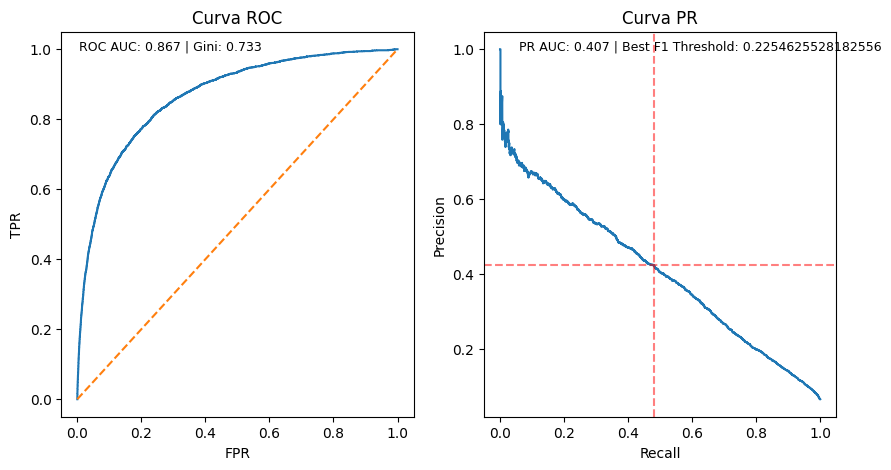

In [79]:
fig = curves_roc_pr(y_true= y_val, y_score= predict_val)
fig

Calibration Curve

,bins,materialidad,y_real_mean,y_score_mean,dif_nom,dif_var_%
0,"(0.00205, 0.0978]",37538,0.025015,0.025903,-0.000888,-3.43
1,"(0.0978, 0.193]",3495,0.144778,0.133669,0.011109,8.31
2,"(0.193, 0.287]",1326,0.244344,0.236321,0.008023,3.39
3,"(0.287, 0.382]",914,0.345733,0.331215,0.014518,4.38
4,"(0.382, 0.477]",671,0.441133,0.427986,0.013147,3.07
5,"(0.477, 0.572]",467,0.516060,0.520599,-0.004539,-0.87
6,"(0.572, 0.667]",325,0.621538,0.616056,0.005483,0.89
7,"(0.667, 0.761]",163,0.644172,0.709591,-0.065419,-9.22
8,"(0.761, 0.856]",81,0.765432,0.798000,-0.032568,-4.08
9,"(0.856, 0.951]",20,0.850000,0.887530,-0.037530,-4.23


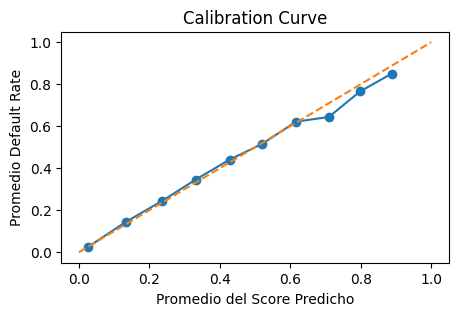

In [102]:
table_calibration, fig = calibration_curve(y_true= y_val, y_score= predict_val, method_bin= 'cut', show_curve= True)
display(table_calibration)
fig

KS (Kolmogorov-Smirnov)

,decil,Malos_Acumulados_%,Buenos_Acumulados_%,KS
0,1,56,7,49
1,2,73,16,57
2,3,83,26,57
3,4,89,37,52
4,5,93,47,46
5,6,95,57,38
6,7,97,68,29
7,8,99,79,20
8,9,99,89,10
9,10,100,100,0


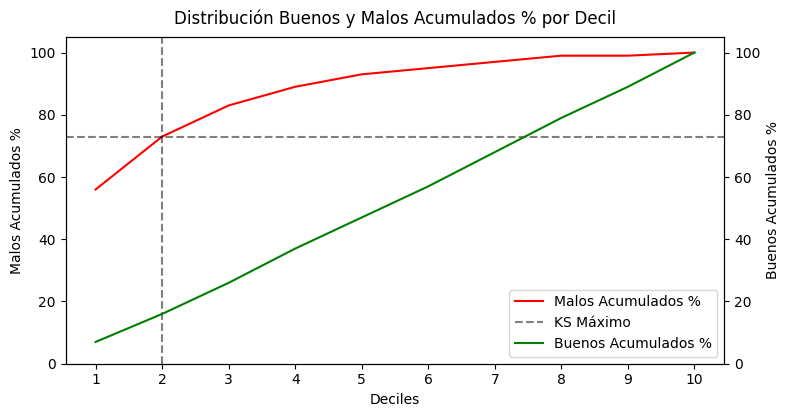

In [116]:
table, fig = ks_table(y_true= y_val, y_score= predict_val, method_bin = 'qcut', show_curve= True)
display(table)
fig

Bad Rate por banda

In [151]:
table = bad_rate_decil(y_true= y_val, y_score= predict_val, method_bin = 'qcut')
table

,Decil,Clientes,Malos,Bad_Rate_%,Monotonicidad
0,1,4500,17,0.38,No viola Monotonicidad
1,2,4500,26,0.58,No viola Monotonicidad
2,3,4500,36,0.80,No viola Monotonicidad
3,4,4500,63,1.40,No viola Monotonicidad
4,5,4500,78,1.73,No viola Monotonicidad
5,6,4500,119,2.64,No viola Monotonicidad
6,7,4500,176,3.91,No viola Monotonicidad
7,8,4500,296,6.58,No viola Monotonicidad
8,9,4500,519,11.53,No viola Monotonicidad
9,10,4500,1678,37.29,No viola Monotonicidad


In [143]:
table = bad_rate_acumulado(y_true= y_val, y_score= predict_val, method_bin = 'qcut')
table

,Corte,Clientes_Aprobados,Malos_Aprobados,Bad_rate_aprobado_%
0,Hasta decil 1,4500,17,0.4
1,Hasta decil 2,9000,43,0.5
2,Hasta decil 3,13500,79,0.6
3,Hasta decil 4,18000,142,0.8
4,Hasta decil 5,22500,220,1.0
5,Hasta decil 6,27000,339,1.3
6,Hasta decil 7,31500,515,1.6
7,Hasta decil 8,36000,811,2.3
8,Hasta decil 9,40500,1330,3.3
9,Hasta decil 10,45000,3008,6.7


,Poblacion_Acumulada_%,Malos_Acumulados,Total_Malos,Gain_%,Lift_Acumulado
0,10,1678,3008,56,5.60
1,20,2197,3008,73,3.65
2,30,2493,3008,83,2.77
3,40,2669,3008,89,2.22
4,50,2788,3008,93,1.86
5,60,2866,3008,95,1.58
6,70,2929,3008,97,1.39
7,80,2965,3008,99,1.24
8,90,2991,3008,99,1.10
9,100,3008,3008,100,1.00


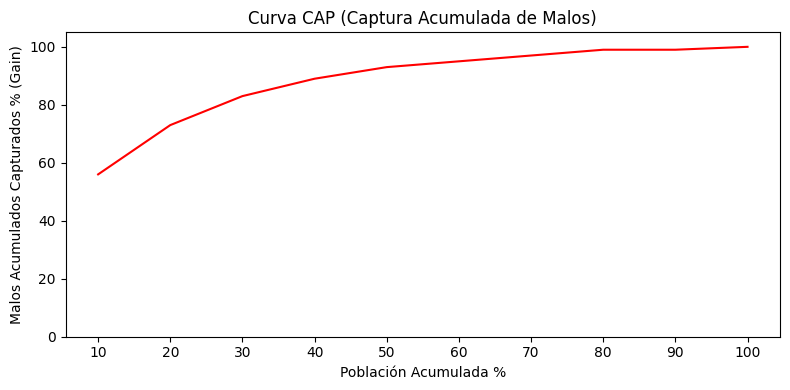

In [169]:
table, fig = lift_acumulado(y_true= y_val, y_score= predict_val, method_bin = 'qcut', show_curve= True)
display(table)
fig

In [171]:
table = lift_bandas(y_true= y_val, y_score= predict_val, method_bin = 'qcut')
table

,Decil,Bad_Rate_%,Lift_por_Banda
0,1,0.4,0.1
1,2,0.6,0.1
2,3,0.8,0.1
3,4,1.4,0.2
4,5,1.7,0.3
5,6,2.6,0.4
6,7,3.9,0.6
7,8,6.6,1.0
8,9,11.5,1.7
9,10,37.3,5.6


In [184]:
table = top_decile_capture(y_true= y_val, y_score= predict_val, method_bin = 'qcut')
table

,Decil,Malos en el decil,Malos Totales,Top Decil Capture_%,Interpretación
0,1,1678,3008,56,El peor 10% de clientes concentra el 56% de to...


In [195]:
table = tabla_deciles_completa(y_true= y_val, y_score= predict_val, method_bin = 'qcut')
table

,Decil,Clientes,Malos,Buenos,Bad_Rate_%,Malos_Acumulados_%,KS_%,Gain_%,Lift
0,1,4500,1678,2822,37.3,56,49,56,5.6
1,2,4500,519,3981,11.5,73,57,73,3.6
2,3,4500,296,4204,6.6,83,57,83,2.8
3,4,4500,176,4324,3.9,89,52,89,2.2
4,5,4500,119,4381,2.6,93,46,93,1.9
5,6,4500,78,4422,1.7,95,38,95,1.6
6,7,4500,63,4437,1.4,97,29,97,1.4
7,8,4500,36,4464,0.8,99,20,99,1.2
8,9,4500,26,4474,0.6,99,10,99,1.1
9,10,4500,17,4483,0.4,100,0,100,1.0


### Interpretabilidad con SHAP

In [127]:
import shap

In [ ]:
# Crear el background
background = X_train[FEATS_NUMERICAS].sample(
    n = min(400, len(X_train)),
    random_state = 42
)
# Crear el explainer
explainer = shap.TreeExplainer(
    model= model_catboost,
    feature_perturbation= 'interventional',
    data= background,
    model_output='probability'
)

# Guardar los SHAP Values
shap_values = explainer(X_val)
# Traer los graficos que necesites

100%|===================| 44978/45000 [15:55<00:00]        

AttributeError: 'Explanation' object has no attribute 'expected_value'

In [134]:
explainer.expected_value

0.05617251061891861

In [137]:
shap_matrix = pd.DataFrame(shap_values.values, columns= X_val.columns, index= X_val.index)
shap_matrix

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
31295,-0.034824,0.005231,-0.015536,-0.018762,0.002702,-0.008262,0.165973,0.003543,0.128372,-0.002112
96644,-0.019302,-0.000621,-0.009194,-0.007282,-0.000977,0.006834,-0.006917,-0.001794,-0.005162,-0.000356
144650,0.031111,-0.014634,-0.012791,0.003019,0.005567,-0.004436,-0.007936,-0.002155,-0.007219,0.000507
96912,-0.020819,-0.000681,-0.010512,-0.001577,0.004219,-0.002139,-0.006826,0.001565,-0.005512,-0.000405
120438,-0.018968,-0.005545,-0.009239,-0.002647,-0.001191,0.008068,-0.007122,-0.001262,-0.005176,-0.000244
...,...,...,...,...,...,...,...,...,...,...
113351,0.071751,0.012441,0.038093,0.026340,-0.012958,0.025266,0.218330,-0.008507,0.192775,-0.000781
126614,-0.024558,0.001152,0.018706,0.006150,-0.007496,-0.003654,-0.007449,-0.001027,-0.005846,-0.000846
137308,0.086969,0.004759,-0.014820,-0.014113,-0.004762,-0.008750,0.150755,0.005886,-0.009935,0.004249
87701,-0.017524,-0.007967,-0.009346,0.003972,-0.005643,-0.002442,-0.006228,0.000731,-0.005119,-0.000461


In [147]:
shap_matrix.mean(axis=1)

31295     0.022633
96644    -0.004477
144650   -0.000897
96912    -0.004269
120438   -0.004333
            ...   
113351    0.056275
126614   -0.002487
137308    0.020024
87701    -0.005003
93696    -0.004504
Length: 45000, dtype: float64

In [151]:
shap_matrix['NumberOfTime30-59DaysPastDueNotWorse'].abs().mean()

0.018412538426517536

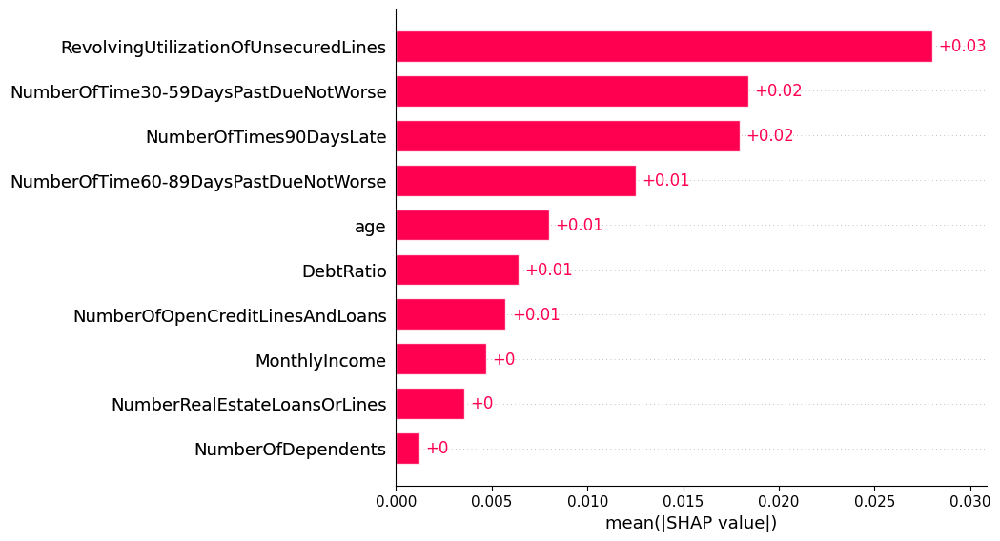

In [144]:
shap.plots.bar(shap_values, max_display= 10)

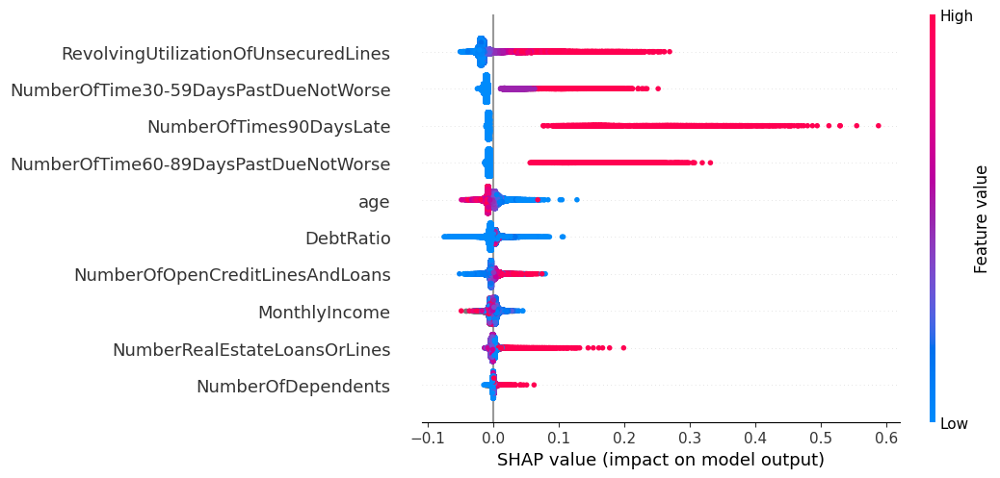

In [152]:
shap.plots.beeswarm(shap_values, max_display= 10)

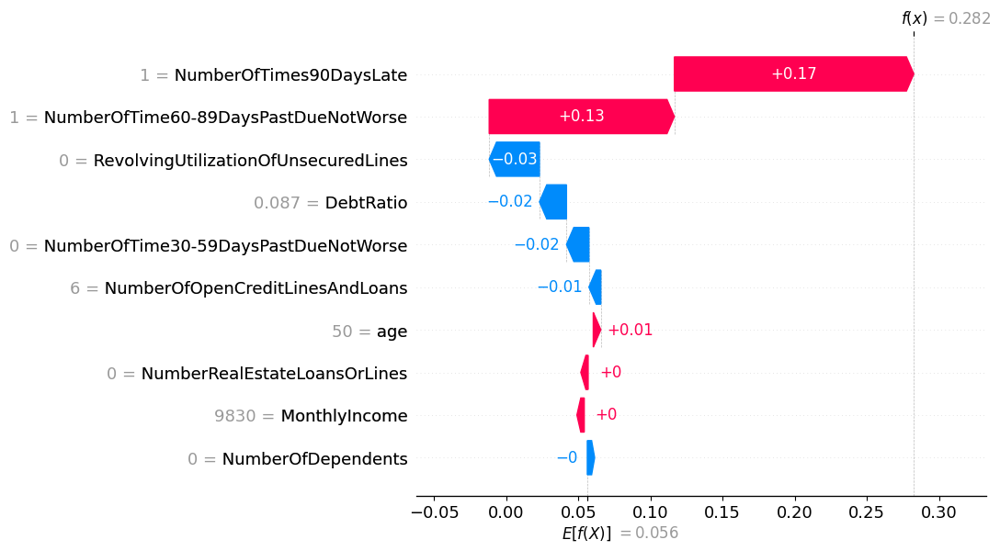

In [153]:
shap.plots.waterfall(shap_values[0])

## Parte Económica

In [13]:
parametros_economicos = {
    "tasa_activa_anual": 0.5683,          # 56.83%
    "tasa_de_fondeo_anual": 0.065,        # 6.5%
    "gastos_operativos": 500000.00,       # S/ 500,000 (monto nominal anual, ajustar a tu portafolio)
    "impuesto_a_la_renta": 0.295          # 29.5%
}

categorias_clientes_sbs = {
    'Normal' : 0.01,
    'CPP': 0.05,
    'Deficiente': 0.25,
    'Dudoso': 0.6,
    'Perdida': 1
}

In [63]:
## Consideramos de forma aleatoria la asignación de saldos para cada cliente así
## como su clasificación en la categoría de cliente según la SBS
df_val_economico = pd.read_csv('../data/external/df_val_enriquecido.csv', index_col= 0)
df_val_economico

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,SeriousDlqin2yrs,saldo_actual,clasificacion_sbs,Garantia
31295,0.000000,50,0,0.087478,9830.0,6,1,0,1,0.0,1,34066.11,Dudoso,0.00
96644,0.005770,52,0,0.063603,10486.0,16,0,1,0,0.0,0,24050.82,Normal,23576.68
144650,0.807706,64,0,0.555962,4100.0,8,0,2,0,1.0,0,15673.71,Normal,13993.45
96912,0.001076,53,0,0.269278,2450.0,8,0,0,0,0.0,0,16544.56,Normal,0.00
120438,0.022680,58,0,0.369809,17600.0,17,0,2,0,0.0,1,37928.36,Normal,25124.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113351,1.000000,46,1,14.000000,NaN,0,2,0,2,0.0,1,8512.13,Perdida,0.00
126614,0.065615,48,1,1292.000000,NaN,7,0,2,0,NaN,0,13963.86,CPP,10162.63
137308,1.000000,51,0,0.059608,7800.0,3,1,0,0,2.0,0,13140.99,Dudoso,0.00
87701,0.020657,67,0,43.000000,NaN,7,0,0,0,0.0,0,12944.41,Normal,0.00


In [64]:
predict_val = model_catboost.predict_proba(df_val_economico[FEATS_NUMERICAS])[:,1]
predict_val

array([0.28249796, 0.0114007 , 0.04720734, ..., 0.256411  , 0.00614358,
       0.01112998])

#### Métricas del Saldo de la cartera

In [62]:
table = tabla_deciles_completa_saldos(y_true= y_val, y_score= predict_val, series_saldo= df_val_economico['saldo_actual'], method_bin = 'qcut')
table

,Decil,Clientes,Saldo_Millones,Saldo_Malo_Millones,Saldo_Bueno_Millones,Bad_Rate_%_Saldo,Captura_Saldo_Malo_%,Lift_Saldo_Acumulado,Malos,Bad_Rate_%,Malos_Acumulados_%,KS_%,Gain_%,Lift
0,1,4500,S/73.0M,S/27.1M,S/45.8M,37,52,6.5,1678,37.3,56,49,56,5.6
1,2,4500,S/78.3M,S/9.3M,S/69.0M,12,70,4.1,519,11.5,73,57,73,3.6
2,3,4500,S/83.9M,S/5.9M,S/78.0M,7,81,3.0,296,6.6,83,57,83,2.8
3,4,4500,S/88.9M,S/3.4M,S/85.4M,4,88,2.4,176,3.9,89,52,89,2.2
4,5,4500,S/88.1M,S/2.1M,S/86.1M,2,91,1.9,119,2.6,93,46,93,1.9
5,6,4500,S/84.0M,S/1.3M,S/82.7M,2,94,1.6,78,1.7,95,38,95,1.6
6,7,4500,S/90.2M,S/1.4M,S/88.8M,2,97,1.4,63,1.4,97,29,97,1.4
7,8,4500,S/99.0M,S/0.9M,S/98.1M,1,98,1.2,36,0.8,99,20,99,1.2
8,9,4500,S/92.8M,S/0.5M,S/92.3M,1,99,1.1,26,0.6,99,10,99,1.1
9,10,4500,S/90.1M,S/0.4M,S/89.6M,0,100,1.0,17,0.4,100,0,100,1.0


In [ ]:
"""
Ahora debo calcular:
+ Ingreso financiero -> saldo x tasa activa
- Egreso financiero -> costo del fondeo
= Margen financiero bruto
- Provisión neta
= Margen neto de riesgo
- Gastos Operativos
= Resultado antes de impuestos
- Impuestos
= Utilidad neta

ROA = utilidad neta / saldo del portafolio
"""

In [51]:
table = seleccion_deciles_agrupamiento(y_true= y_val, y_score= predict_val)
table

,Decil,Bad_Rate_%,Lift_por_Banda,KS_%
0,"(0.002, 0.00711]",0.4,0.1,10.1
1,"(0.00711, 0.00946]",0.6,0.1,19.9
2,"(0.00946, 0.0121]",0.8,0.1,29.3
3,"(0.0121, 0.0154]",1.4,0.2,37.8
4,"(0.0154, 0.0207]",1.7,0.3,45.7
5,"(0.0207, 0.031]",2.6,0.4,52.2
6,"(0.031, 0.0496]",3.9,0.6,56.7
7,"(0.0496, 0.0816]",6.6,1.0,56.8
8,"(0.0816, 0.167]",11.5,1.7,49.1
9,"(0.167, 0.951]",37.3,5.6,0.0


In [55]:
## Elección de agrupamiento de riesgo
bins = [-np.inf, 0.0121, 0.031, 0.167, np.inf]
labels = ['Bajo Riesgo', 'Medio Riesgo', 'Alto Riesgo' ,'Muy Alto Riesgo']

In [58]:
tasa_activa_por_segmento = {
    'Bajo Riesgo': 0.14,
    'Medio Riesgo': 0.18,
    'Alto Riesgo': 0.28,
    'Muy Alto Riesgo': 0.35
}

In [57]:
table = tanteo_deciles(y_true= y_val, y_score= predict_val, bins= bins, labels= labels)
table

,Decil,Bad_Rate_%,Lift_por_Banda,KS_%
0,Bajo Riesgo,0.6,0.1,29.4
1,Medio Riesgo,1.9,0.3,52.2
2,Alto Riesgo,7.3,1.1,49.1
3,Muy Alto Riesgo,37.3,5.6,0.0


In [59]:
table['segmentos'] = table['Decil'].map(tasa_activa_por_segmento)
table

,Decil,Bad_Rate_%,Lift_por_Banda,KS_%,segmentos
0,Bajo Riesgo,0.6,0.1,29.4,0.14
1,Medio Riesgo,1.9,0.3,52.2,0.18
2,Alto Riesgo,7.3,1.1,49.1,0.28
3,Muy Alto Riesgo,37.3,5.6,0.0,0.35


In [113]:
## Elección de agrupamiento de riesgo
bins = [-np.inf, 0.0121, 0.031, 0.167, np.inf]
labels = ['Bajo Riesgo', 'Medio Riesgo', 'Alto Riesgo' ,'Muy Alto Riesgo']

tasa_activa_por_segmento = {
    'Bajo Riesgo': 0.14,
    'Medio Riesgo': 0.18,
    'Alto Riesgo': 0.28,
    'Muy Alto Riesgo': 0.35
}

parametros_economicos = {         
    "tasa_de_fondeo_anual": 0.065,        
    "gastos_operativos": 500000.00,       
    "impuesto_a_la_renta": 0.30
}

categorias_clientes_sbs = {
    'Normal' : 0.01,
    'CPP': 0.05,
    'Deficiente': 0.25,
    'Dudoso': 0.6,
    'Perdida': 1
}


In [156]:
df_gestion_portafolio, df_escenarios = gestion_portafolio(
        y_true = df_val_economico[TARGET],
        y_score= predict_val,
        saldo= df_val_economico['saldo_actual'],
        garantia= df_val_economico['Garantia'],
        categoria_cliente = df_val_economico['clasificacion_sbs'],
        bins = bins,
        labels= labels,
        tasa_activa_por_segmento = tasa_activa_por_segmento,
        costo_fondeo = parametros_economicos['tasa_de_fondeo_anual'],
        reglas_categorias_cliente = categorias_clientes_sbs,
        gastos_operativos = parametros_economicos['gastos_operativos'],
        impuesto_renta = parametros_economicos['impuesto_a_la_renta'],
        mostrar_escenarios= True
        )

In [154]:
df_gestion_portafolio

,Segmento,Saldo_M,Participacion_%,Tasa_Activa_%,Spread_%,Provisiones_M,Provisiones/Margen_%,Gastos_M,Utilidad_Neta_M,ROA_%
0,Bajo Riesgo,S/282.6M,32.6,14.0,7.5,S/2.1M,9.9,S/0.16M,S/13.3M,4.7
1,Medio Riesgo,S/261.3M,30.1,18.0,11.5,S/2.3M,7.6,S/0.15M,S/19.3M,7.4
2,Alto Riesgo,S/251.3M,28.9,28.0,21.5,S/7.5M,13.9,S/0.14M,S/32.5M,12.9
3,Muy Alto Riesgo,S/73.0M,8.4,35.0,28.5,S/24.8M,119.2,S/0.04M,S/-2.8M,-3.9


In [155]:
df_escenarios

,Escenario_de_Corte,Saldo_Acumulado_M,Participacion_Acumulada_%,Utilidad_Neta_Acumulada_M,ROA_Escenario_%
0,Aprobar hasta Bajo Riesgo,S/282.6M,32.6,S/13.3M,4.7
1,Aprobar hasta Medio Riesgo,S/543.8M,62.7,S/32.6M,6.0
2,Aprobar hasta Alto Riesgo,S/795.1M,91.6,S/65.0M,8.2
3,Aprobar hasta Muy Alto Riesgo,S/868.1M,100.0,S/62.2M,7.2
